In [ ]:
# For Google Colab use
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
    %cd '/content/drive/MyDrive/Colab Notebooks/MInf2 Colab/_TRAINING/ViT'    
except ModuleNotFoundError:
    pass

In [1]:
!pip install -U tensorflow-addons

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras import layers, Model, metrics
from keras.callbacks import EarlyStopping, ModelCheckpoint
from tqdm import tqdm
import tensorflow_addons as tfa
from tensorflow import keras
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import f1_score, recall_score, precision_score, roc_curve, roc_auc_score
from vit_keras import vit, utils
from datetime import datetime
import seaborn as sns
import os
from keras.preprocessing.image import load_img, img_to_array
import numpy as np
import seaborn as sns
import re
import ast
import os
import cv2
import random


# Plotting parameters
sns.set()
plt.rc('font', family = 'serif')
# plt.rcParams['axes.labelsize'] = 20
# plt.rcParams['axes.titlesize'] = 20 

In [3]:
# Helper Functions

def get_binary_testset(dataset_name):
    """
    dataset_name -> trainset, valset, testset
    """
    trainset, valset, testset = None, None, None
    dataset_name = dataset_name.lower()
    path_2_root = "../.."

    if not "oc" in dataset_name:
        if "dar" in dataset_name and "oc" not in dataset_name: # DariusAf_Deepfake_Database
            trainset = f"{path_2_root}/_DATASETS/DariusAf_Deepfake_Database/train_test"
            testset = f"{path_2_root}/_DATASETS/DariusAf_Deepfake_Database/validation"

        if "avg" in dataset_name: # Celeb-avg-30
            if "celeb" in dataset_name:
                trainset = f"{path_2_root}/_DATASETS/Celeb-DF-v2/Celeb-avg-30"
                testset = f"{path_2_root}/_DATASETS/Celeb-DF-v2/Celeb-avg-30-test"
                
            elif "deepfake" in dataset_name:
                trainset = f"{path_2_root}/_DATASETS/FF/Deepfakes_avg"
            elif "face2face" in dataset_name:
                trainset = f"{path_2_root}/_DATASETS/FF/Face2Face_avg"
            elif "shift" in dataset_name:
                trainset = f"{path_2_root}/_DATASETS/FF/FaceShifter_avg"
            elif "swap" in dataset_name:
                trainset = f"{path_2_root}/_DATASETS/FF/FaceSwap_avg"
            elif "neural" in dataset_name:
                trainset = f"{path_2_root}/_DATASETS/FF/NeuralTextures_avg"

        elif "rnd" in dataset_name: # Celeb-rnd-30
            if "celeb" in dataset_name:
                trainset = f"{path_2_root}/_DATASETS/Celeb-DF-v2/Celeb-rnd-30"
                testset = f"{path_2_root}/_DATASETS/Celeb-DF-v2/Celeb-rnd-30-test"
                
            elif "deepfake" in dataset_name:
                trainset = f"{path_2_root}/_DATASETS/FF/Deepfakes_rnd"
            elif "face2face" in dataset_name:
                trainset = f"{path_2_root}/_DATASETS/FF/Face2Face_rnd"
            elif "shift" in dataset_name:
                trainset = f"{path_2_root}/_DATASETS/FF/FaceShifter_rnd"
            elif "swap" in dataset_name:
                trainset = f"{path_2_root}/_DATASETS/FF/FaceSwap_rnd"
            elif "neural" in dataset_name:
                trainset = f"{path_2_root}/_DATASETS/FF/NeuralTextures_rnd"

        elif "diff" in dataset_name: # Celeb-diff-30
            trainset = f"{path_2_root}/_DATASETS/Celeb-DF-v2/Celeb-diff-30"
            testset = f"{path_2_root}/_DATASETS/Celeb-DF-v2/Celeb-diff-30-test"

        elif "ff" in dataset_name and "deepfake" in dataset_name:
            trainset = f"{path_2_root}/_DATASETS/FF/Deepfakes_avg"

        elif "ff" in dataset_name and "deepfake" in dataset_name:
            trainset = f"{path_2_root}/_DATASETS/FF/Deepfakes_avg"

    else: # oc
        if "dar" in dataset_name: # DariusAf_Deepfake_Database
            trainset = f"{path_2_root}/_DATASETS/DariusAf_Deepfake_Database-OC/real-train/" # unary
            testset = f"{path_2_root}/_DATASETS/DariusAf_Deepfake_Database-OC/realfake-test/" # binary

        elif "avg" in dataset_name:
            pass

        elif "rnd" in dataset_name: # Celeb-rnd-30-OC
            trainset = f"{path_2_root}/_DATASETS/Celeb-DF-v2-OC/Celeb-rnd-30-OC-real-train/" # unary
            valset = f"{path_2_root}/_DATASETS/Celeb-DF-v2-OC/Celeb-rnd-30-OC-real-val/"  # unary
            testset = f"{path_2_root}/_DATASETS/Celeb-DF-v2-OC/Celeb-rnd-30-OC-realfake-test/" # binary

    testset = trainset if testset==None else testset
    valset = trainset if valset==None else valset
    return trainset, valset, testset




def current_datetime_string():
    """
    'ddmm_hhmm'
    """
    date_of_run = str(datetime.now())
    for s in ("-", " ", ":", "_"):
        date_of_run = date_of_run.replace(s, "_") 
    date_of_run = "".join(date_of_run.split("_")[1:3] + ["_"] + date_of_run.split("_")[3:-1])
    return date_of_run



def eval_model_w_gen(EVAL_GEN, avg_eval=False):
    y_pred = []
    y_true = []
    CLASSIFIER = VIT_FE
    if avg_eval:
        # running average eval, set of images from each video is single data point (not indep.)
        path_to_testset_real_class = f"{TEST_DATASET}/{[d for d in os.listdir(TEST_DATASET) if 'real' in d][0]}"
        path_to_testset_fake_class = f"{TEST_DATASET}/{[d for d in os.listdir(TEST_DATASET) if 'real' not in d][0]}"

        for y_dir_pth, y_label in [(path_to_testset_fake_class, 1), (path_to_testset_real_class, 0)]:
            img_dir_list = os.listdir(y_dir_pth)
            Vpths = []
            # loop over all single videos
            for og_fname in set([re.split('_\d+.png', img_name)[0] for img_name in img_dir_list]):

                all_imgs_for_vid = [i for i in img_dir_list if og_fname in i]
                path_all_imgs_for_vid = [f"{y_dir_pth}/{i}" for i in all_imgs_for_vid]
                V = []

                # loop over all frames from single video
                for path_to_test_img in path_all_imgs_for_vid:
                    t = load_img(path_to_test_img, target_size=(IMAGE_SIZE, IMAGE_SIZE))
                    t = img_to_array(t)
                    # V += [t]
                    V += [vit.preprocess_inputs(t)]
                V = np.array(V)#**1./255
                
                y_pred += [np.average(CLASSIFIER.predict(V)).tolist()]
                y_true += [y_label]
    else:
        for b, (X, y) in tqdm(enumerate(EVAL_GEN), total=len(EVAL_GEN)-1):
            y_pred += CLASSIFIER.predict(X).tolist() 
            y_true += y.tolist()
            # break
            if b >= (EVAL_GEN.samples / EVAL_GEN.batch_size) - 1:
                break

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    y_pred_rint = np.rint(y_pred)
    return y_true, y_pred, y_pred_rint




def plot_history():
    fig, (ax1, ax2) = plt.subplots(2, figsize = (10, 10), sharex=True)
    ax1.plot(history.history['loss'])
    ax1.plot(history.history['val_loss'])
    ax1.set_title(f'{experiment_name} Training/Validation Losses')
    ax1.set_ylabel('Loss')
    ax1.legend(['Training Loss', 'Validation Loss'], loc='center right')

    ax2.plot(history.history['auc'])
    ax2.plot(history.history['val_auc'])
    ax2.set_title(f'{experiment_name} Training/Validation AUCs')
    ax2.set_ylabel('Loss')
    ax2.set_xlabel('Epoch')
    ax2.legend(['Training AUC', 'Validation AUC'], loc='upper right')
    plt.savefig(f"./Results/{fname}_Losses.pdf", dpi=fig.dpi)
    plt.show()




def save_statstxt_aucplot(is_running_avg_eval=False):
    y_true, y_pred, y_pred_rint = eval_model_w_gen(EVAL_GEN=TEST_GEN, avg_eval=is_running_avg_eval)
    auroc = roc_auc_score(y_true, y_pred)
    fpr, tpr, _  = roc_curve(y_true, y_pred)

    # If model is worse than random but so much worse that, it's predicting the opposite way
    if auroc < .5:
        auroc = 1 - auroc
        fpr, tpr = tpr, fpr
        y_pred = np.ones(y_pred.shape) - y_pred

    # Get F1, Precision and Recall
    f1 = f1_score(y_true, y_pred_rint)
    prec = precision_score(y_true, y_pred_rint)
    recall = recall_score(y_true, y_pred_rint)

    # Plot AUC
    plt.figure()
    lw = 2
    plt.plot(fpr, tpr, color='magenta', lw=lw, label='ROC Curve (Area = %0.3f)' % auroc)
    plt.plot([0, 1], [0, 1], color='black', lw=lw, linestyle='--')
    extra_xylim = 0.025
    plt.xlim([0.0 - extra_xylim, 1.0 + extra_xylim])
    plt.ylim([0.0 - extra_xylim, 1.0 + extra_xylim])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f"Test AUROC {experiment_name}")
    plt.legend(loc="lower right")
    plt.savefig(f"./Results/{fname}_AUC.pdf")
    plt.show()

    with open(f"./Results/{fname}.txt", "w") as f:
        f.write(f"{experiment_name, model_name, dataset_name, fname}\n")
        f.write(f"auroc={auroc}\n")
        f.write(f"f1={f1}\n")
        f.write(f"prec={prec}\n")
        f.write(f"recall={recall}\n")
        f.write(f"\nfpr={[f for f in fpr]}\n")
        f.write(f"\ntpr={[t for t in tpr]}\n")
        f.write(f"\ny_true={[t for t in y_true]}\n")
        f.write(f"\ny_pred={[p[0] if 'arr' in str(type(p)) and len(p) else p for p in y_pred]}\n")
        try:
            f.write(f"\nhistory={history}")
        except NameError:
            pass




class WarmUpCosine(keras.optimizers.schedules.LearningRateSchedule):
    # Some code is taken from:
    # https://www.kaggle.com/ashusma/training-rfcx-tensorflow-tpu-effnet-b2.
    def __init__(
        self, learning_rate_base, total_steps, warmup_learning_rate, warmup_steps
    ):
        super(WarmUpCosine, self).__init__()

        self.learning_rate_base = learning_rate_base
        self.total_steps = total_steps
        self.warmup_learning_rate = warmup_learning_rate
        self.warmup_steps = warmup_steps
        self.pi = tf.constant(np.pi)

    def __call__(self, step):
        if self.total_steps < self.warmup_steps:
            raise ValueError("Total_steps must be larger or equal to warmup_steps.")

        cos_annealed_lr = tf.cos(
            self.pi
            * (tf.cast(step, tf.float32) - self.warmup_steps)
            / float(self.total_steps - self.warmup_steps)
        )
        learning_rate = 0.5 * self.learning_rate_base * (1 + cos_annealed_lr)

        if self.warmup_steps > 0:
            if self.learning_rate_base < self.warmup_learning_rate:
                raise ValueError(
                    "Learning_rate_base must be larger or equal to "
                    "warmup_learning_rate."
                )
            slope = (
                self.learning_rate_base - self.warmup_learning_rate
            ) / self.warmup_steps
            warmup_rate = slope * tf.cast(step, tf.float32) + self.warmup_learning_rate
            learning_rate = tf.where(
                step < self.warmup_steps, warmup_rate, learning_rate
            )
        return tf.where(
            step > self.total_steps, 0.0, learning_rate, name="learning_rate"
        )

In [ ]:
model_name = "MAE-OC"
experiment_name = f"{model_name} (RND CDFv2 OC Dataset)" # CHANGE THESE
dataset_name = "Celeb-rnd-30"                   # CHANGE THESE
dataset_type = "AVG" if "AVG" in dataset_name.upper() else "RND"
fname = f"ViT_{dataset_name.replace('-', '_')}_{current_datetime_string()}"

In [4]:
# DATA
BUFFER_SIZE = 1024
BATCH_SIZE = 64
AUTO = tf.data.AUTOTUNE
INPUT_SHAPE = (256, 256, 3)
NUM_CLASSES = 2

# OPTIMIZER
LEARNING_RATE = 5e-3
WEIGHT_DECAY = 1e-4

# PRETRAINING
EPOCHS = 100

# AUGMENTATION
IMAGE_SIZE = 256  # We will resize input images to this size.
PATCH_SIZE = IMAGE_SIZE // 8 # Size of the patches to be extracted from the input images.
NUM_PATCHES = (IMAGE_SIZE // PATCH_SIZE) ** 2
MASK_PROPORTION = 0.75  # We have found 75% masking to give us the best results.

# ENCODER and DECODER
LAYER_NORM_EPS = 1e-6
ENC_PROJECTION_DIM = 128
DEC_PROJECTION_DIM = 64
ENC_NUM_HEADS = 4
ENC_LAYERS = 6
DEC_NUM_HEADS = 4
DEC_LAYERS = (
    2  # The decoder is lightweight but should be reasonably deep for reconstruction.
)
ENC_TRANSFORMER_UNITS = [
    ENC_PROJECTION_DIM * 2,
    ENC_PROJECTION_DIM,
]  # Size of the transformer layers.
DEC_TRANSFORMER_UNITS = [
    DEC_PROJECTION_DIM * 2,
    DEC_PROJECTION_DIM,
]

In [5]:
DATASET = get_binary_testset("Celeb-DF-v2-OC")
VAL_DATASET = get_binary_testset("Celeb-DF-v2-OC-val")
TEST_DATASET = get_binary_testset("Celeb-DF-v2-OC-test")
IMG_DATAGEN = ImageDataGenerator()

GEN = IMG_DATAGEN.flow_from_directory(DATASET,
                                      target_size=(IMAGE_SIZE, IMAGE_SIZE),
                                      batch_size=BATCH_SIZE,
                                      seed=SEED)

VAL_GEN = IMG_DATAGEN.flow_from_directory(VAL_DATASET,
                                          target_size=(IMAGE_SIZE, IMAGE_SIZE),
                                          batch_size=BATCH_SIZE,
                                          seed=SEED)

TEST_GEN = IMG_DATAGEN.flow_from_directory(TEST_DATASET,
                                          target_size=(IMAGE_SIZE, IMAGE_SIZE),
                                          batch_size=BATCH_SIZE,
                                          seed=SEED,
                                          class_mode="binary")

Found 5627 images belonging to 1 classes.
Found 1600 images belonging to 1 classes.
Found 19638 images belonging to 2 classes.


In [6]:
def get_train_augmentation_model():
    model = keras.Sequential(
        [
            layers.Rescaling(1 / 255.0),
            layers.Resizing(INPUT_SHAPE[0] + 20, INPUT_SHAPE[0] + 20),
            layers.RandomCrop(IMAGE_SIZE, IMAGE_SIZE),
            layers.RandomFlip("horizontal"),
        ],
        name="train_data_augmentation",
    )
    return model


def get_test_augmentation_model():
    model = keras.Sequential(
        [layers.Rescaling(1 / 255.0), layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),],
        name="test_data_augmentation",
    )
    return model


In [7]:
class Patches(layers.Layer):
    def __init__(self, patch_size=PATCH_SIZE, **kwargs):
        super().__init__(**kwargs)
        self.patch_size = patch_size

        # Assuming the image has three channels each patch would be
        # of size (patch_size, patch_size, 3).
        self.resize = layers.Reshape((-1, patch_size * patch_size * 3))

    def call(self, images):
        # Create patches from the input images
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )

        # Reshape the patches to (batch, num_patches, patch_area) and return it.
        patches = self.resize(patches)
        return patches

    def show_patched_image(self, images, patches):
        # This is a utility function which accepts a batch of images and its
        # corresponding patches and help visualize one image and its patches
        # side by side.
        idx = np.random.choice(patches.shape[0])
        print(f"Index selected: {idx}.")

        plt.figure(figsize=(4, 4))
        plt.imshow(keras.utils.array_to_img(images[idx]))
        plt.axis("off")
        plt.show()

        n = int(np.sqrt(patches.shape[1]))
        plt.figure(figsize=(4, 4))
        for i, patch in enumerate(patches[idx]):
            ax = plt.subplot(n, n, i + 1)
            patch_img = tf.reshape(patch, (self.patch_size, self.patch_size, 3))
            plt.imshow(keras.utils.img_to_array(patch_img))
            plt.axis("off")
        plt.show()

        # Return the index chosen to validate it outside the method.
        return idx

    # taken from https://stackoverflow.com/a/58082878/10319735
    def reconstruct_from_patch(self, patch):
        # This utility function takes patches from a *single* image and
        # reconstructs it back into the image. This is useful for the train
        # monitor callback.
        num_patches = patch.shape[0]
        n = int(np.sqrt(num_patches))
        patch = tf.reshape(patch, (num_patches, self.patch_size, self.patch_size, 3))
        rows = tf.split(patch, n, axis=0)
        rows = [tf.concat(tf.unstack(x), axis=1) for x in rows]
        reconstructed = tf.concat(rows, axis=0)
        return reconstructed


Index selected: 56.


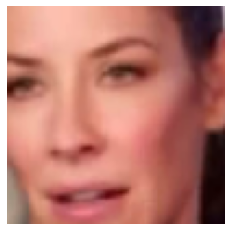

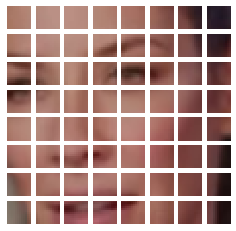

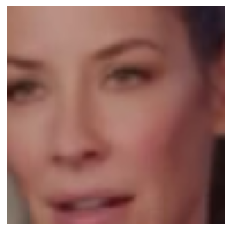

In [8]:
# Get a batch of images.
image_batch = next(iter(GEN.next()))

# Augment the images.
augmentation_model = get_train_augmentation_model()
augmented_images = augmentation_model(image_batch)

# Define the patch layer.
patch_layer = Patches()

# Get the patches from the batched images.
patches = patch_layer(images=augmented_images)

# Now pass the images and the corresponding patches
# to the `show_patched_image` method.
random_index = patch_layer.show_patched_image(images=augmented_images, patches=patches)

# Chose the same chose image and try reconstructing the patches
# into the original image.
image = patch_layer.reconstruct_from_patch(patches[random_index])
plt.imshow(image)
plt.axis("off")
plt.show()

In [9]:
class PatchEncoder(layers.Layer):
    def __init__(
        self,
        patch_size=PATCH_SIZE,
        projection_dim=ENC_PROJECTION_DIM,
        mask_proportion=MASK_PROPORTION,
        downstream=False,
        **kwargs,
    ):
        super().__init__(**kwargs)
        self.patch_size = patch_size
        self.projection_dim = projection_dim
        self.mask_proportion = mask_proportion
        self.downstream = downstream

        # This is a trainable mask token initialized randomly from a normal
        # distribution.
        self.mask_token = tf.Variable(
            tf.random.normal([1, patch_size * patch_size * 3]), trainable=True
        )

    def build(self, input_shape):
        (_, self.num_patches, self.patch_area) = input_shape

        # Create the projection layer for the patches.
        self.projection = layers.Dense(units=self.projection_dim)

        # Create the positional embedding layer.
        self.position_embedding = layers.Embedding(
            input_dim=self.num_patches, output_dim=self.projection_dim
        )

        # Number of patches that will be masked.
        self.num_mask = int(self.mask_proportion * self.num_patches)

    def call(self, patches):
        # Get the positional embeddings.
        batch_size = tf.shape(patches)[0]
        positions = tf.range(start=0, limit=self.num_patches, delta=1)
        pos_embeddings = self.position_embedding(positions[tf.newaxis, ...])
        pos_embeddings = tf.tile(
            pos_embeddings, [batch_size, 1, 1]
        )  # (B, num_patches, projection_dim)

        # Embed the patches.
        patch_embeddings = (
            self.projection(patches) + pos_embeddings
        )  # (B, num_patches, projection_dim)

        if self.downstream:
            return patch_embeddings
        else:
            mask_indices, unmask_indices = self.get_random_indices(batch_size)
            # The encoder input is the unmasked patch embeddings. Here we gather
            # all the patches that should be unmasked.
            unmasked_embeddings = tf.gather(
                patch_embeddings, unmask_indices, axis=1, batch_dims=1
            )  # (B, unmask_numbers, projection_dim)

            # Get the unmasked and masked position embeddings. We will need them
            # for the decoder.
            unmasked_positions = tf.gather(
                pos_embeddings, unmask_indices, axis=1, batch_dims=1
            )  # (B, unmask_numbers, projection_dim)
            masked_positions = tf.gather(
                pos_embeddings, mask_indices, axis=1, batch_dims=1
            )  # (B, mask_numbers, projection_dim)

            # Repeat the mask token number of mask times.
            # Mask tokens replace the masks of the image.
            mask_tokens = tf.repeat(self.mask_token, repeats=self.num_mask, axis=0)
            mask_tokens = tf.repeat(
                mask_tokens[tf.newaxis, ...], repeats=batch_size, axis=0
            )

            # Get the masked embeddings for the tokens.
            masked_embeddings = self.projection(mask_tokens) + masked_positions
            return (
                unmasked_embeddings,  # Input to the encoder.
                masked_embeddings,  # First part of input to the decoder.
                unmasked_positions,  # Added to the encoder outputs.
                mask_indices,  # The indices that were masked.
                unmask_indices,  # The indices that were unmaksed.
            )

    def get_random_indices(self, batch_size):
        # Create random indices from a uniform distribution and then split
        # it into mask and unmask indices.
        rand_indices = tf.argsort(
            tf.random.uniform(shape=(batch_size, self.num_patches)), axis=-1
        )
        mask_indices = rand_indices[:, : self.num_mask]
        unmask_indices = rand_indices[:, self.num_mask :]
        return mask_indices, unmask_indices

    def generate_masked_image(self, patches, unmask_indices):
        # Choose a random patch and it corresponding unmask index.
        idx = np.random.choice(patches.shape[0])
        patch = patches[idx]
        unmask_index = unmask_indices[idx]

        # Build a numpy array of same shape as patch.
        new_patch = np.zeros_like(patch)

        # Iterate of the new_patch and plug the unmasked patches.
        count = 0
        for i in range(unmask_index.shape[0]):
            new_patch[unmask_index[i]] = patch[unmask_index[i]]
        return new_patch, idx


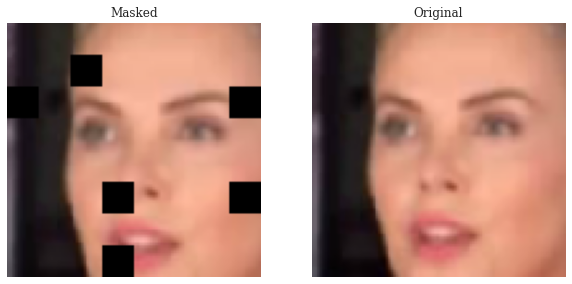

In [10]:
# Create the patch encoder layer.
patch_encoder = PatchEncoder()

# Get the embeddings and positions.
(
    unmasked_embeddings,
    masked_embeddings,
    unmasked_positions,
    mask_indices,
    unmask_indices,
) = patch_encoder(patches=patches)


# Show a maksed patch image.
new_patch, random_index = patch_encoder.generate_masked_image(patches, unmask_indices)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
img = patch_layer.reconstruct_from_patch(new_patch)
plt.imshow(keras.utils.array_to_img(img))
plt.axis("off")
plt.title("Masked")
plt.subplot(1, 2, 2)
img = augmented_images[random_index]
plt.imshow(keras.utils.array_to_img(img))
plt.axis("off")
plt.title("Original")
plt.show()

In [11]:
def mlp(x, dropout_rate, hidden_units):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x


In [12]:
def create_encoder(num_heads=ENC_NUM_HEADS, num_layers=ENC_LAYERS):
    inputs = layers.Input((None, ENC_PROJECTION_DIM))
    x = inputs

    for _ in range(num_layers):
        # Layer normalization 1.
        x1 = layers.LayerNormalization(epsilon=LAYER_NORM_EPS)(x)

        # Create a multi-head attention layer.
        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=ENC_PROJECTION_DIM, dropout=0.1
        )(x1, x1)

        # Skip connection 1.
        x2 = layers.Add()([attention_output, x])

        # Layer normalization 2.
        x3 = layers.LayerNormalization(epsilon=LAYER_NORM_EPS)(x2)

        # MLP.
        x3 = mlp(x3, hidden_units=ENC_TRANSFORMER_UNITS, dropout_rate=0.1)

        # Skip connection 2.
        x = layers.Add()([x3, x2])

    outputs = layers.LayerNormalization(epsilon=LAYER_NORM_EPS)(x)
    return keras.Model(inputs, outputs, name="mae_encoder")


In [13]:
def create_decoder(
    num_layers=DEC_LAYERS, num_heads=DEC_NUM_HEADS, image_size=IMAGE_SIZE
):
    inputs = layers.Input((NUM_PATCHES, ENC_PROJECTION_DIM))
    x = layers.Dense(DEC_PROJECTION_DIM)(inputs)

    for _ in range(num_layers):
        # Layer normalization 1.
        x1 = layers.LayerNormalization(epsilon=LAYER_NORM_EPS)(x)

        # Create a multi-head attention layer.
        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=DEC_PROJECTION_DIM, dropout=0.1
        )(x1, x1)

        # Skip connection 1.
        x2 = layers.Add()([attention_output, x])

        # Layer normalization 2.
        x3 = layers.LayerNormalization(epsilon=LAYER_NORM_EPS)(x2)

        # MLP.
        x3 = mlp(x3, hidden_units=DEC_TRANSFORMER_UNITS, dropout_rate=0.1)

        # Skip connection 2.
        x = layers.Add()([x3, x2])

    x = layers.LayerNormalization(epsilon=LAYER_NORM_EPS)(x)
    x = layers.Flatten()(x)
    pre_final = layers.Dense(units=image_size * image_size * 3, activation="sigmoid")(x)
    outputs = layers.Reshape((image_size, image_size, 3))(pre_final)

    return keras.Model(inputs, outputs, name="mae_decoder")


In [14]:
class MaskedAutoencoder(keras.Model):
    def __init__(
        self,
        train_augmentation_model,
        test_augmentation_model,
        patch_layer,
        patch_encoder,
        encoder,
        decoder,
        **kwargs,
    ):
        super().__init__(**kwargs)
        self.train_augmentation_model = train_augmentation_model
        self.test_augmentation_model = test_augmentation_model
        self.patch_layer = patch_layer
        self.patch_encoder = patch_encoder
        self.encoder = encoder
        self.decoder = decoder

    def calculate_loss(self, images, test=False):
        # Augment the input images.
        if test:
            augmented_images = self.test_augmentation_model(images)
        else:
            augmented_images = self.train_augmentation_model(images)

        # Patch the augmented images.
        patches = self.patch_layer(augmented_images)

        # Encode the patches.
        (
            unmasked_embeddings,
            masked_embeddings,
            unmasked_positions,
            mask_indices,
            unmask_indices,
        ) = self.patch_encoder(patches)

        # Pass the unmaksed patche to the encoder.
        encoder_outputs = self.encoder(unmasked_embeddings)

        # Create the decoder inputs.
        encoder_outputs = encoder_outputs + unmasked_positions
        decoder_inputs = tf.concat([encoder_outputs, masked_embeddings], axis=1)

        # Decode the inputs.
        decoder_outputs = self.decoder(decoder_inputs)
        decoder_patches = self.patch_layer(decoder_outputs)

        loss_patch = tf.gather(patches, mask_indices, axis=1, batch_dims=1)
        loss_output = tf.gather(decoder_patches, mask_indices, axis=1, batch_dims=1)

        # Compute the total loss.
        total_loss = self.compiled_loss(loss_patch, loss_output)

        return total_loss, loss_patch, loss_output

    def train_step(self, images):
        with tf.GradientTape() as tape:
            total_loss, loss_patch, loss_output = self.calculate_loss(images)

        # Apply gradients.
        train_vars = [
            self.train_augmentation_model.trainable_variables,
            self.patch_layer.trainable_variables,
            self.patch_encoder.trainable_variables,
            self.encoder.trainable_variables,
            self.decoder.trainable_variables,
        ]
        grads = tape.gradient(total_loss, train_vars)
        tv_list = []
        for (grad, var) in zip(grads, train_vars):
            for g, v in zip(grad, var):
                tv_list.append((g, v))
        self.optimizer.apply_gradients(tv_list)

        # Report progress.
        self.compiled_metrics.update_state(loss_patch, loss_output)
        return {m.name: m.result() for m in self.metrics}

    def test_step(self, images):
        total_loss, loss_patch, loss_output = self.calculate_loss(images, test=True)

        # Update the trackers.
        self.compiled_metrics.update_state(loss_patch, loss_output)
        return {m.name: m.result() for m in self.metrics}


In [15]:
train_augmentation_model = get_train_augmentation_model()
test_augmentation_model = get_test_augmentation_model()
patch_layer = Patches()
patch_encoder = PatchEncoder()
encoder = create_encoder()
decoder = create_decoder()

mae_model = MaskedAutoencoder(
    train_augmentation_model=train_augmentation_model,
    test_augmentation_model=test_augmentation_model,
    patch_layer=patch_layer,
    patch_encoder=patch_encoder,
    encoder=encoder,
    decoder=decoder,
)

In [16]:
# Taking a batch of test inputs to measure model's progress.
test_images = next(iter(VAL_GEN.next()))


class TrainMonitor(keras.callbacks.Callback):
    def __init__(self, epoch_interval=None):
        self.epoch_interval = epoch_interval

    def on_epoch_end(self, epoch, logs=None):
        if self.epoch_interval and epoch % self.epoch_interval == 0:
            test_images = next(iter(VAL_GEN.next()))
            test_augmented_images = self.model.test_augmentation_model(test_images)
            test_patches = self.model.patch_layer(test_augmented_images)
            (
                test_unmasked_embeddings,
                test_masked_embeddings,
                test_unmasked_positions,
                test_mask_indices,
                test_unmask_indices,
            ) = self.model.patch_encoder(test_patches)
            test_encoder_outputs = self.model.encoder(test_unmasked_embeddings)
            test_encoder_outputs = test_encoder_outputs + test_unmasked_positions
            test_decoder_inputs = tf.concat(
                [test_encoder_outputs, test_masked_embeddings], axis=1
            )
            test_decoder_outputs = self.model.decoder(test_decoder_inputs)

            # Show a maksed patch image.
            test_masked_patch, idx = self.model.patch_encoder.generate_masked_image(
                test_patches, test_unmask_indices
            )
            print(f"\nIdx chosen: {idx}")
            original_image = test_augmented_images[idx]
            masked_image = self.model.patch_layer.reconstruct_from_patch(
                test_masked_patch
            )
            reconstructed_image = test_decoder_outputs[idx]

            fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

            ax[0].imshow(original_image)
            ax[0].set_title(f"Original: {epoch:03d}")
            plt.axis("off")

            ax[1].imshow(masked_image)
            ax[1].set_title(f"Masked: {epoch:03d}")
            plt.axis("off")

            ax[2].imshow(reconstructed_image)
            ax[2].set_title(f"Resonstructed: {epoch:03d}")
            plt.axis("off")
            
            plt.show()
            plt.close()


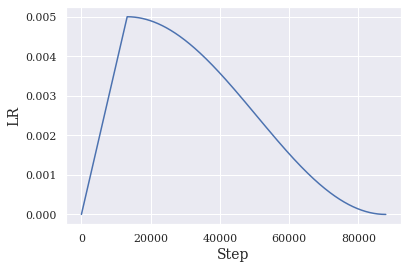

In [17]:
# Some code is taken from:
# https://www.kaggle.com/ashusma/training-rfcx-tensorflow-tpu-effnet-b2.


class WarmUpCosine(keras.optimizers.schedules.LearningRateSchedule):
    def __init__(
        self, learning_rate_base, total_steps, warmup_learning_rate, warmup_steps
    ):
        super(WarmUpCosine, self).__init__()

        self.learning_rate_base = learning_rate_base
        self.total_steps = total_steps
        self.warmup_learning_rate = warmup_learning_rate
        self.warmup_steps = warmup_steps
        self.pi = tf.constant(np.pi)

    def __call__(self, step):
        if self.total_steps < self.warmup_steps:
            raise ValueError("Total_steps must be larger or equal to warmup_steps.")

        cos_annealed_lr = tf.cos(
            self.pi
            * (tf.cast(step, tf.float32) - self.warmup_steps)
            / float(self.total_steps - self.warmup_steps)
        )
        learning_rate = 0.5 * self.learning_rate_base * (1 + cos_annealed_lr)

        if self.warmup_steps > 0:
            if self.learning_rate_base < self.warmup_learning_rate:
                raise ValueError(
                    "Learning_rate_base must be larger or equal to "
                    "warmup_learning_rate."
                )
            slope = (
                self.learning_rate_base - self.warmup_learning_rate
            ) / self.warmup_steps
            warmup_rate = slope * tf.cast(step, tf.float32) + self.warmup_learning_rate
            learning_rate = tf.where(
                step < self.warmup_steps, warmup_rate, learning_rate
            )
        return tf.where(
            step > self.total_steps, 0.0, learning_rate, name="learning_rate"
        )

len_x_train = GEN.n
total_steps = int((len_x_train / BATCH_SIZE) * EPOCHS)
warmup_epoch_percentage = 0.15
warmup_steps = int(total_steps * warmup_epoch_percentage)
scheduled_lrs = WarmUpCosine(
    learning_rate_base=LEARNING_RATE,
    total_steps=total_steps,
    warmup_learning_rate=0.0,
    warmup_steps=warmup_steps,
)

lrs = [scheduled_lrs(step) for step in range(total_steps)]
plt.plot(lrs)
plt.xlabel("Step", fontsize=14)
plt.ylabel("LR", fontsize=14)
plt.show()

# Assemble the callbacks.
train_callbacks = [TrainMonitor(epoch_interval=5)]

In [18]:
optimizer = tfa.optimizers.AdamW(learning_rate=scheduled_lrs, weight_decay=WEIGHT_DECAY)


# Compile and pretrain the model.
mae_model.compile(
    optimizer=optimizer, loss=keras.losses.MeanSquaredError(), metrics=["mae"]
)

def load_best_model(model):
    PATH_2_MAP_WEIGHTS_DIR = "../../_WEIGHTS/mae/"
    if os.listdir(PATH_2_MAP_WEIGHTS_DIR):
        model.load_weights(f"{PATH_2_MAP_WEIGHTS_DIR}/weights")

# load_best_model(mae_model)

1/1 [==============================] - ETA: 0s - loss: 0.0704 - mae: 0.2194
Idx chosen: 12


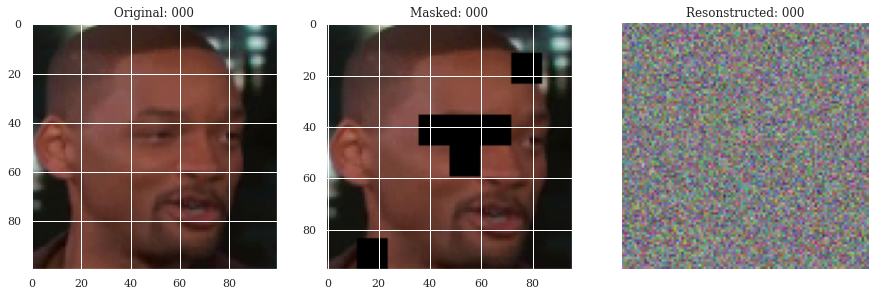

1/1 [==============================] - 8s 8s/step - loss: 0.0704 - mae: 0.2194 - val_loss: 0.0707 - val_mae: 0.2195


In [19]:
# # single bacth
X, y = GEN.next()
X = X.astype(np.uint8)
train_ds = tf.data.Dataset.from_tensor_slices(X)
train_ds = train_ds.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(AUTO)

X, y = VAL_GEN.next()
val_ds = tf.data.Dataset.from_tensor_slices(X)
val_ds = val_ds.batch(BATCH_SIZE).prefetch(AUTO)
history = mae_model.fit(
    train_ds, epochs=1, validation_data=train_ds, callbacks=train_callbacks,
)

Epoch 1/1000
88/88 [==============================] - ETA: 0s - loss: 0.0435 - mae: 0.1645WARNING:tensorflow:Layers in a Sequential model should only have a single input tensor. Received: inputs=(<tf.Tensor 'IteratorGetNext:0' shape=(None, None, None, None) dtype=float32>, <tf.Tensor 'IteratorGetNext:1' shape=(None, None) dtype=float32>). Consider rewriting this model with the Functional API.

Idx chosen: 7


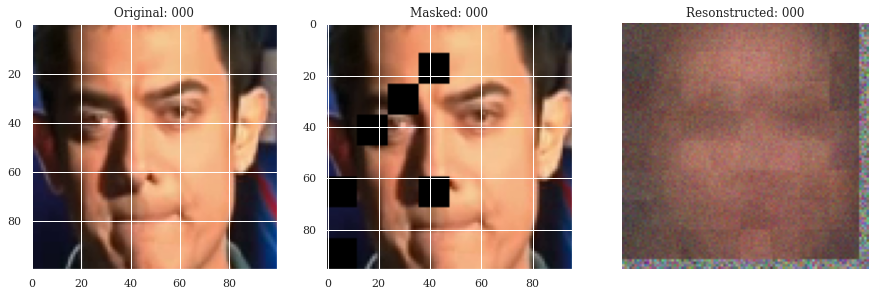

88/88 [==============================] - 24s 228ms/step - loss: 0.0435 - mae: 0.1645 - val_loss: 0.0297 - val_mae: 0.1355
Epoch 2/1000
88/88 [==============================] - 19s 212ms/step - loss: 0.0245 - mae: 0.1210 - val_loss: 0.0254 - val_mae: 0.1233
Epoch 3/1000
88/88 [==============================] - 19s 218ms/step - loss: 0.0232 - mae: 0.1173 - val_loss: 0.0248 - val_mae: 0.1212
Epoch 4/1000
88/88 [==============================] - 19s 215ms/step - loss: 0.0227 - mae: 0.1159 - val_loss: 0.0246 - val_mae: 0.1222
Epoch 5/1000
88/88 [==============================] - 19s 215ms/step - loss: 0.0218 - mae: 0.1131 - val_loss: 0.0222 - val_mae: 0.1147
Epoch 6/1000
88/88 [==============================] - ETA: 0s - loss: 0.0210 - mae: 0.1109
Idx chosen: 49


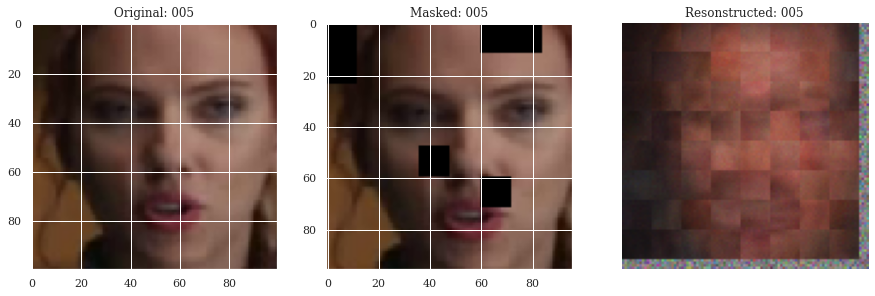

88/88 [==============================] - 19s 220ms/step - loss: 0.0210 - mae: 0.1109 - val_loss: 0.0209 - val_mae: 0.1108
Epoch 7/1000
88/88 [==============================] - 18s 211ms/step - loss: 0.0195 - mae: 0.1065 - val_loss: 0.0196 - val_mae: 0.1059
Epoch 8/1000
88/88 [==============================] - 19s 217ms/step - loss: 0.0183 - mae: 0.1022 - val_loss: 0.0189 - val_mae: 0.1037
Epoch 9/1000
88/88 [==============================] - 19s 215ms/step - loss: 0.0173 - mae: 0.0996 - val_loss: 0.0188 - val_mae: 0.1037
Epoch 10/1000
88/88 [==============================] - 19s 213ms/step - loss: 0.0165 - mae: 0.0968 - val_loss: 0.0173 - val_mae: 0.1004
Epoch 11/1000
88/88 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.0958
Idx chosen: 5


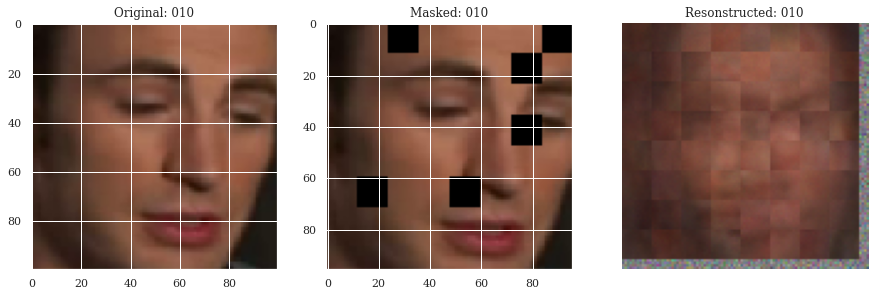

88/88 [==============================] - 19s 219ms/step - loss: 0.0162 - mae: 0.0958 - val_loss: 0.0167 - val_mae: 0.0982
Epoch 12/1000
88/88 [==============================] - 19s 216ms/step - loss: 0.0158 - mae: 0.0947 - val_loss: 0.0166 - val_mae: 0.0967
Epoch 13/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0156 - mae: 0.0938 - val_loss: 0.0168 - val_mae: 0.0968
Epoch 14/1000
88/88 [==============================] - 19s 212ms/step - loss: 0.0154 - mae: 0.0934 - val_loss: 0.0161 - val_mae: 0.0967
Epoch 15/1000
88/88 [==============================] - 18s 211ms/step - loss: 0.0149 - mae: 0.0916 - val_loss: 0.0158 - val_mae: 0.0941
Epoch 16/1000
88/88 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.0893
Idx chosen: 59


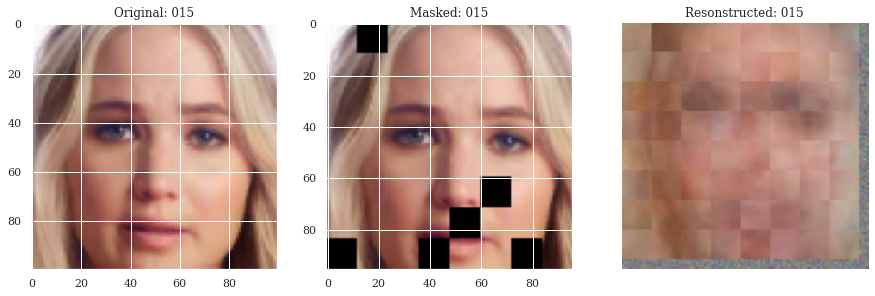

88/88 [==============================] - 19s 218ms/step - loss: 0.0143 - mae: 0.0893 - val_loss: 0.0153 - val_mae: 0.0920
Epoch 17/1000
88/88 [==============================] - 19s 213ms/step - loss: 0.0139 - mae: 0.0884 - val_loss: 0.0149 - val_mae: 0.0905
Epoch 18/1000
88/88 [==============================] - 19s 214ms/step - loss: 0.0137 - mae: 0.0874 - val_loss: 0.0149 - val_mae: 0.0912
Epoch 19/1000
88/88 [==============================] - 9s 98ms/step - loss: 0.0138 - mae: 0.0875 - val_loss: 0.0151 - val_mae: 0.0915
Epoch 20/1000
88/88 [==============================] - 19s 213ms/step - loss: 0.0134 - mae: 0.0859 - val_loss: 0.0141 - val_mae: 0.0883
Epoch 21/1000
88/88 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0.0845
Idx chosen: 57


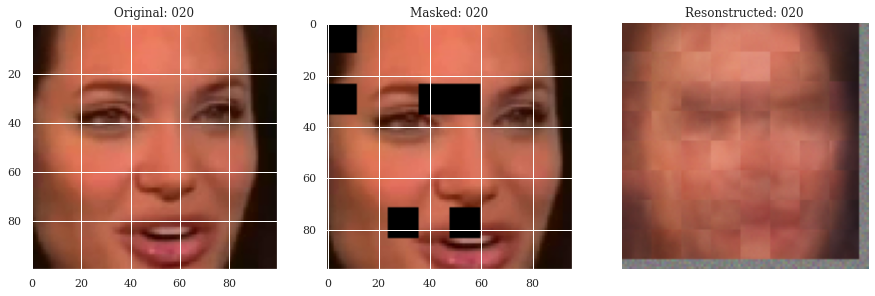

88/88 [==============================] - 9s 103ms/step - loss: 0.0130 - mae: 0.0845 - val_loss: 0.0143 - val_mae: 0.0886
Epoch 22/1000
88/88 [==============================] - 19s 212ms/step - loss: 0.0126 - mae: 0.0830 - val_loss: 0.0137 - val_mae: 0.0866
Epoch 23/1000
88/88 [==============================] - 19s 213ms/step - loss: 0.0124 - mae: 0.0827 - val_loss: 0.0135 - val_mae: 0.0867
Epoch 24/1000
88/88 [==============================] - 9s 100ms/step - loss: 0.0121 - mae: 0.0814 - val_loss: 0.0146 - val_mae: 0.0879
Epoch 25/1000
88/88 [==============================] - 18s 208ms/step - loss: 0.0118 - mae: 0.0802 - val_loss: 0.0134 - val_mae: 0.0849
Epoch 26/1000
88/88 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.0800
Idx chosen: 38


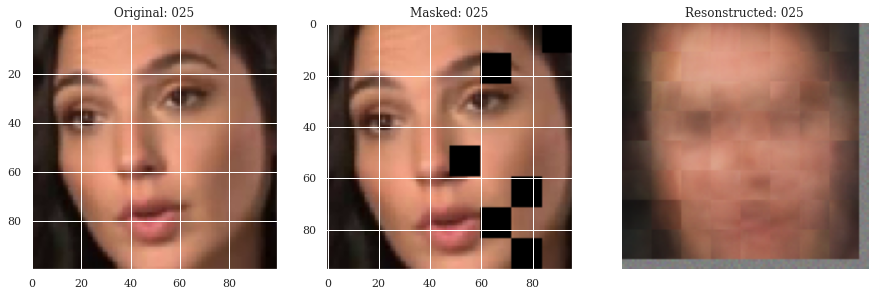

88/88 [==============================] - 9s 103ms/step - loss: 0.0118 - mae: 0.0800 - val_loss: 0.0135 - val_mae: 0.0852
Epoch 27/1000
88/88 [==============================] - 18s 209ms/step - loss: 0.0118 - mae: 0.0804 - val_loss: 0.0131 - val_mae: 0.0841
Epoch 28/1000
88/88 [==============================] - 19s 215ms/step - loss: 0.0113 - mae: 0.0783 - val_loss: 0.0122 - val_mae: 0.0808
Epoch 29/1000
88/88 [==============================] - 9s 100ms/step - loss: 0.0110 - mae: 0.0771 - val_loss: 0.0123 - val_mae: 0.0821
Epoch 30/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0113 - mae: 0.0784 - val_loss: 0.0129 - val_mae: 0.0835
Epoch 31/1000
88/88 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.0768
Idx chosen: 13


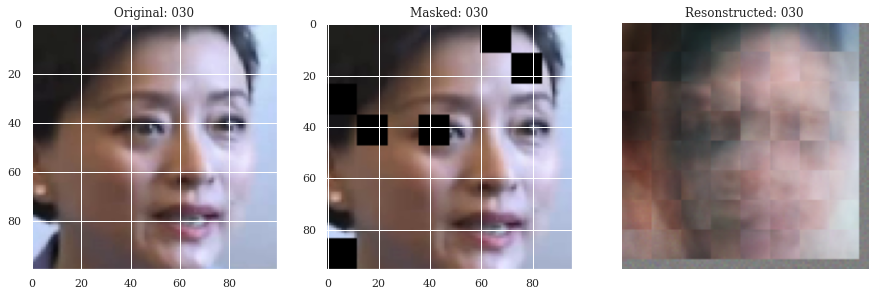

88/88 [==============================] - 19s 222ms/step - loss: 0.0109 - mae: 0.0768 - val_loss: 0.0117 - val_mae: 0.0787
Epoch 32/1000
88/88 [==============================] - 9s 97ms/step - loss: 0.0109 - mae: 0.0768 - val_loss: 0.0130 - val_mae: 0.0836
Epoch 33/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0107 - mae: 0.0759 - val_loss: 0.0120 - val_mae: 0.0816
Epoch 34/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0103 - mae: 0.0746 - val_loss: 0.0119 - val_mae: 0.0804
Epoch 35/1000
88/88 [==============================] - 18s 209ms/step - loss: 0.0104 - mae: 0.0746 - val_loss: 0.0117 - val_mae: 0.0795
Epoch 36/1000
88/88 [==============================] - ETA: 0s - loss: 0.0101 - mae: 0.0735
Idx chosen: 3


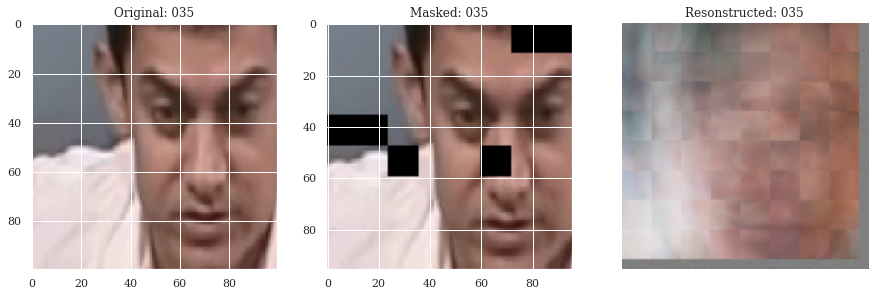

88/88 [==============================] - 19s 219ms/step - loss: 0.0101 - mae: 0.0735 - val_loss: 0.0113 - val_mae: 0.0766
Epoch 37/1000
88/88 [==============================] - 19s 216ms/step - loss: 0.0099 - mae: 0.0729 - val_loss: 0.0112 - val_mae: 0.0760
Epoch 38/1000
88/88 [==============================] - 19s 214ms/step - loss: 0.0099 - mae: 0.0731 - val_loss: 0.0111 - val_mae: 0.0770
Epoch 39/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0099 - mae: 0.0728 - val_loss: 0.0114 - val_mae: 0.0775
Epoch 40/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0097 - mae: 0.0722 - val_loss: 0.0114 - val_mae: 0.0775
Epoch 41/1000
88/88 [==============================] - ETA: 0s - loss: 0.0100 - mae: 0.0735
Idx chosen: 6


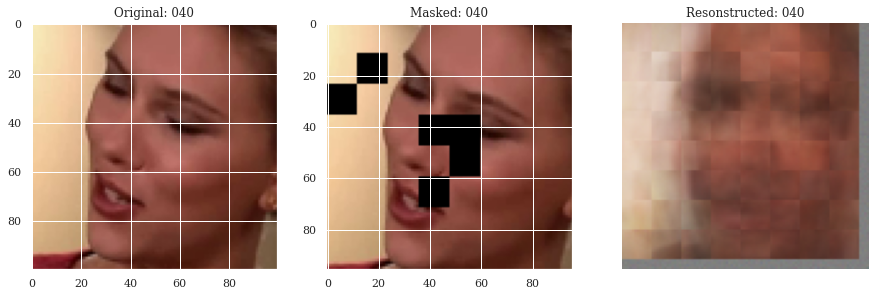

88/88 [==============================] - 18s 211ms/step - loss: 0.0100 - mae: 0.0735 - val_loss: 0.0111 - val_mae: 0.0773
Epoch 42/1000
88/88 [==============================] - 9s 100ms/step - loss: 0.0096 - mae: 0.0720 - val_loss: 0.0112 - val_mae: 0.0765
Epoch 43/1000
88/88 [==============================] - 18s 208ms/step - loss: 0.0095 - mae: 0.0714 - val_loss: 0.0109 - val_mae: 0.0755
Epoch 44/1000
88/88 [==============================] - 19s 213ms/step - loss: 0.0093 - mae: 0.0705 - val_loss: 0.0108 - val_mae: 0.0753
Epoch 45/1000
88/88 [==============================] - 9s 98ms/step - loss: 0.0096 - mae: 0.0715 - val_loss: 0.0111 - val_mae: 0.0767
Epoch 46/1000
88/88 [==============================] - ETA: 0s - loss: 0.0094 - mae: 0.0707
Idx chosen: 48


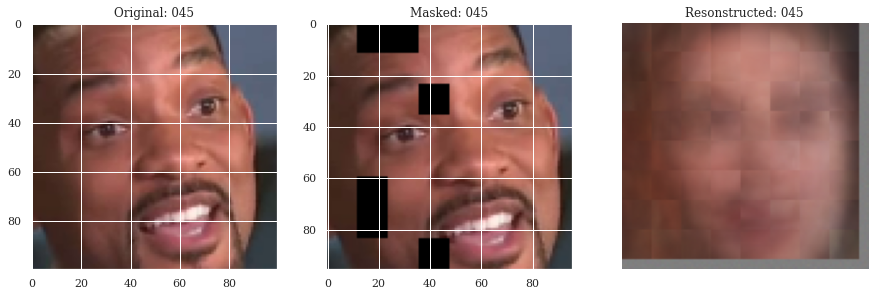

88/88 [==============================] - 19s 216ms/step - loss: 0.0094 - mae: 0.0707 - val_loss: 0.0108 - val_mae: 0.0750
Epoch 47/1000
88/88 [==============================] - 19s 214ms/step - loss: 0.0092 - mae: 0.0702 - val_loss: 0.0106 - val_mae: 0.0744
Epoch 48/1000
88/88 [==============================] - 19s 214ms/step - loss: 0.0092 - mae: 0.0699 - val_loss: 0.0103 - val_mae: 0.0737
Epoch 49/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0091 - mae: 0.0697 - val_loss: 0.0104 - val_mae: 0.0736
Epoch 50/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0092 - mae: 0.0700 - val_loss: 0.0104 - val_mae: 0.0735
Epoch 51/1000
88/88 [==============================] - ETA: 0s - loss: 0.0092 - mae: 0.0698
Idx chosen: 61


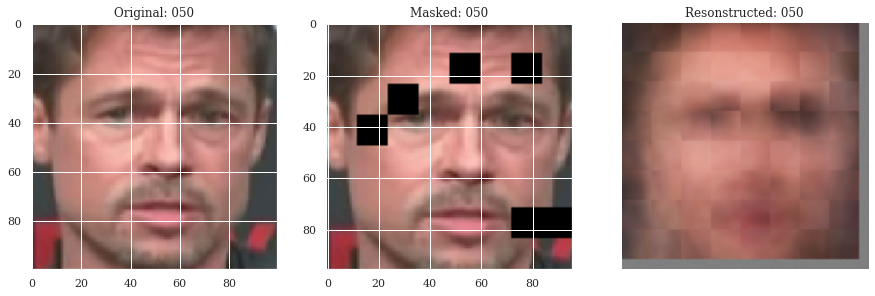

88/88 [==============================] - 9s 100ms/step - loss: 0.0092 - mae: 0.0698 - val_loss: 0.0108 - val_mae: 0.0752
Epoch 52/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0091 - mae: 0.0697 - val_loss: 0.0108 - val_mae: 0.0753
Epoch 53/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0093 - mae: 0.0704 - val_loss: 0.0105 - val_mae: 0.0735
Epoch 54/1000
88/88 [==============================] - 18s 210ms/step - loss: 0.0087 - mae: 0.0679 - val_loss: 0.0102 - val_mae: 0.0731
Epoch 55/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0088 - mae: 0.0686 - val_loss: 0.0108 - val_mae: 0.0764
Epoch 56/1000
88/88 [==============================] - ETA: 0s - loss: 0.0089 - mae: 0.0687
Idx chosen: 39


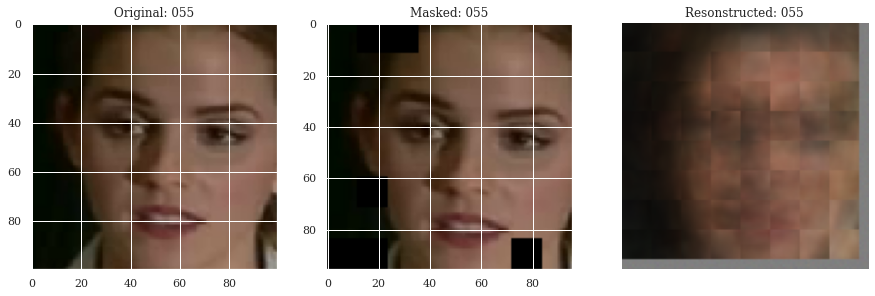

88/88 [==============================] - 19s 216ms/step - loss: 0.0089 - mae: 0.0687 - val_loss: 0.0099 - val_mae: 0.0714
Epoch 57/1000
88/88 [==============================] - 9s 101ms/step - loss: 0.0086 - mae: 0.0677 - val_loss: 0.0101 - val_mae: 0.0721
Epoch 58/1000
88/88 [==============================] - 18s 210ms/step - loss: 0.0086 - mae: 0.0679 - val_loss: 0.0099 - val_mae: 0.0712
Epoch 59/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0087 - mae: 0.0680 - val_loss: 0.0103 - val_mae: 0.0732
Epoch 60/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0089 - mae: 0.0689 - val_loss: 0.0100 - val_mae: 0.0716
Epoch 61/1000
88/88 [==============================] - ETA: 0s - loss: 0.0090 - mae: 0.0692
Idx chosen: 58


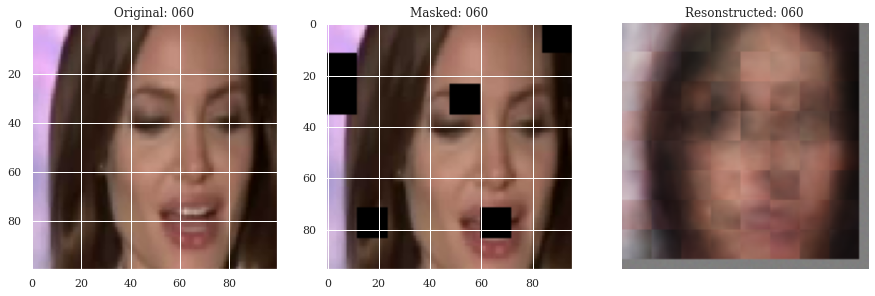

88/88 [==============================] - 19s 213ms/step - loss: 0.0090 - mae: 0.0692 - val_loss: 0.0099 - val_mae: 0.0712
Epoch 62/1000
88/88 [==============================] - 19s 215ms/step - loss: 0.0086 - mae: 0.0677 - val_loss: 0.0098 - val_mae: 0.0721
Epoch 63/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0085 - mae: 0.0671 - val_loss: 0.0105 - val_mae: 0.0729
Epoch 64/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0084 - mae: 0.0666 - val_loss: 0.0100 - val_mae: 0.0709
Epoch 65/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0087 - mae: 0.0679 - val_loss: 0.0100 - val_mae: 0.0713
Epoch 66/1000
88/88 [==============================] - ETA: 0s - loss: 0.0084 - mae: 0.0669
Idx chosen: 2


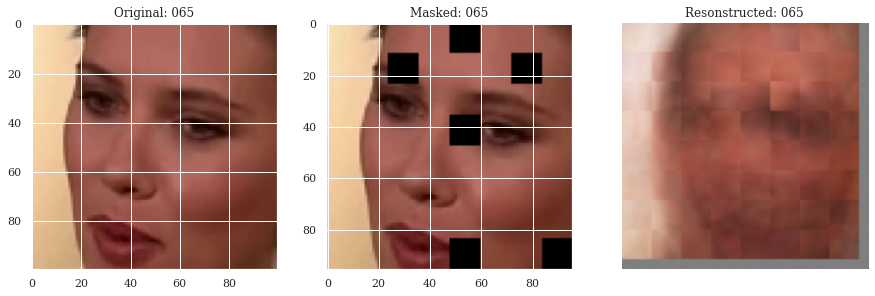

88/88 [==============================] - 19s 217ms/step - loss: 0.0084 - mae: 0.0669 - val_loss: 0.0097 - val_mae: 0.0713
Epoch 67/1000
88/88 [==============================] - 18s 210ms/step - loss: 0.0084 - mae: 0.0668 - val_loss: 0.0093 - val_mae: 0.0700
Epoch 68/1000
88/88 [==============================] - 9s 98ms/step - loss: 0.0083 - mae: 0.0661 - val_loss: 0.0096 - val_mae: 0.0715
Epoch 69/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0081 - mae: 0.0658 - val_loss: 0.0097 - val_mae: 0.0710
Epoch 70/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0083 - mae: 0.0664 - val_loss: 0.0102 - val_mae: 0.0730
Epoch 71/1000
88/88 [==============================] - ETA: 0s - loss: 0.0085 - mae: 0.0670
Idx chosen: 39


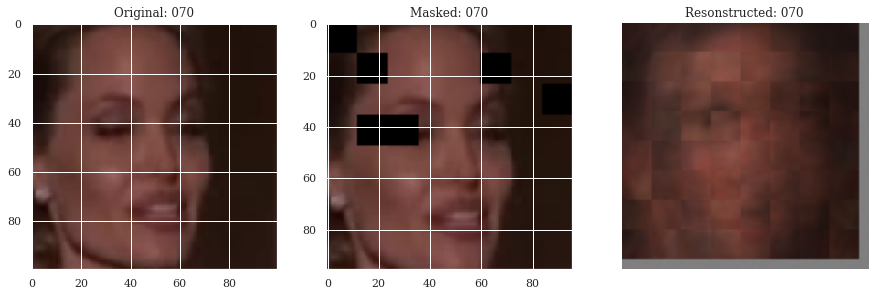

88/88 [==============================] - 9s 100ms/step - loss: 0.0085 - mae: 0.0670 - val_loss: 0.0106 - val_mae: 0.0744
Epoch 72/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0086 - mae: 0.0679 - val_loss: 0.0098 - val_mae: 0.0716
Epoch 73/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0083 - mae: 0.0661 - val_loss: 0.0096 - val_mae: 0.0701
Epoch 74/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0083 - mae: 0.0662 - val_loss: 0.0096 - val_mae: 0.0705
Epoch 75/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0082 - mae: 0.0658 - val_loss: 0.0099 - val_mae: 0.0711
Epoch 76/1000
88/88 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.0655
Idx chosen: 57


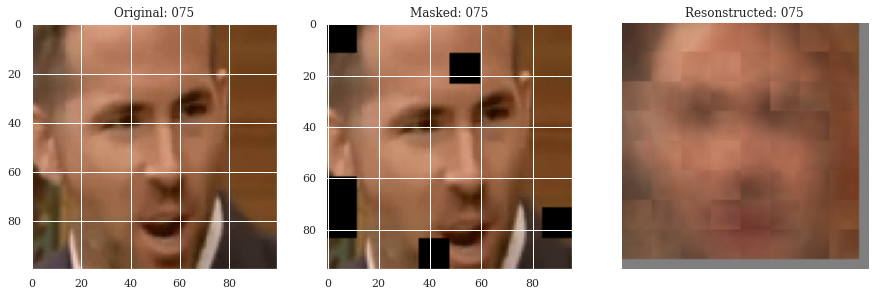

88/88 [==============================] - 9s 100ms/step - loss: 0.0081 - mae: 0.0655 - val_loss: 0.0096 - val_mae: 0.0706
Epoch 77/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0080 - mae: 0.0651 - val_loss: 0.0095 - val_mae: 0.0697
Epoch 78/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0081 - mae: 0.0654 - val_loss: 0.0096 - val_mae: 0.0707
Epoch 79/1000
88/88 [==============================] - 18s 208ms/step - loss: 0.0079 - mae: 0.0646 - val_loss: 0.0093 - val_mae: 0.0693
Epoch 80/1000
88/88 [==============================] - 9s 98ms/step - loss: 0.0080 - mae: 0.0652 - val_loss: 0.0094 - val_mae: 0.0695
Epoch 81/1000
88/88 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.0652
Idx chosen: 5


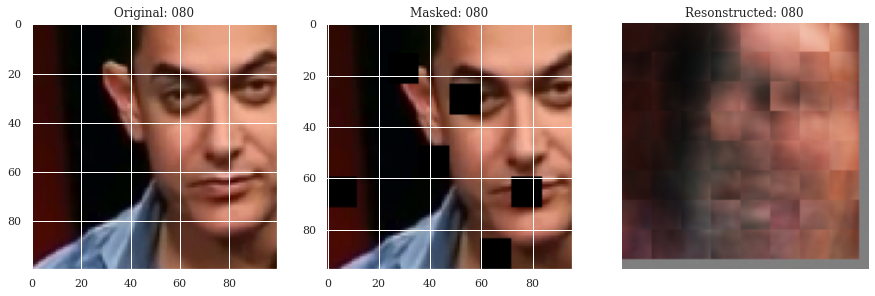

88/88 [==============================] - 9s 99ms/step - loss: 0.0080 - mae: 0.0652 - val_loss: 0.0095 - val_mae: 0.0706
Epoch 82/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0084 - mae: 0.0669 - val_loss: 0.0098 - val_mae: 0.0708
Epoch 83/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0080 - mae: 0.0651 - val_loss: 0.0097 - val_mae: 0.0709
Epoch 84/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0080 - mae: 0.0651 - val_loss: 0.0094 - val_mae: 0.0703
Epoch 85/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0079 - mae: 0.0647 - val_loss: 0.0096 - val_mae: 0.0703
Epoch 86/1000
88/88 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.0652
Idx chosen: 28


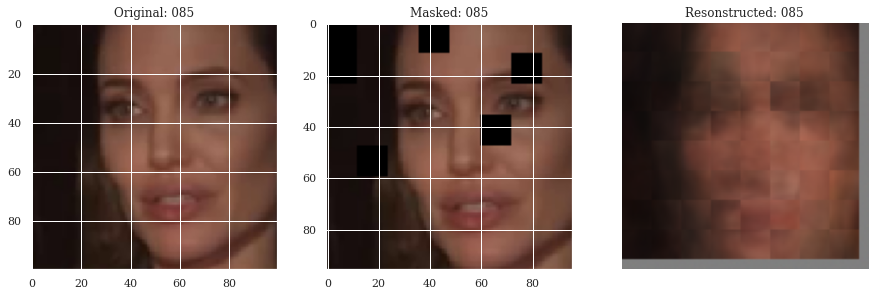

88/88 [==============================] - 19s 216ms/step - loss: 0.0080 - mae: 0.0652 - val_loss: 0.0093 - val_mae: 0.0696
Epoch 87/1000
88/88 [==============================] - 19s 215ms/step - loss: 0.0078 - mae: 0.0644 - val_loss: 0.0091 - val_mae: 0.0690
Epoch 88/1000
88/88 [==============================] - 9s 98ms/step - loss: 0.0080 - mae: 0.0649 - val_loss: 0.0095 - val_mae: 0.0704
Epoch 89/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0077 - mae: 0.0640 - val_loss: 0.0095 - val_mae: 0.0696
Epoch 90/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0077 - mae: 0.0639 - val_loss: 0.0092 - val_mae: 0.0691
Epoch 91/1000
88/88 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.0638
Idx chosen: 39


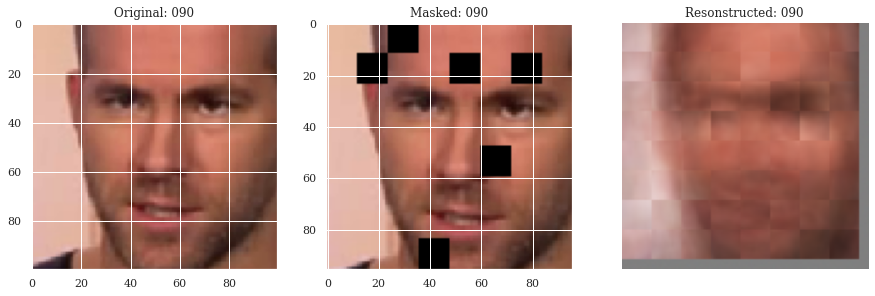

88/88 [==============================] - 9s 99ms/step - loss: 0.0077 - mae: 0.0638 - val_loss: 0.0093 - val_mae: 0.0693
Epoch 92/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0078 - mae: 0.0643 - val_loss: 0.0094 - val_mae: 0.0693
Epoch 93/1000
88/88 [==============================] - 18s 208ms/step - loss: 0.0078 - mae: 0.0642 - val_loss: 0.0091 - val_mae: 0.0679
Epoch 94/1000
88/88 [==============================] - 9s 101ms/step - loss: 0.0078 - mae: 0.0645 - val_loss: 0.0096 - val_mae: 0.0706
Epoch 95/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0078 - mae: 0.0643 - val_loss: 0.0095 - val_mae: 0.0697
Epoch 96/1000
88/88 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.0639
Idx chosen: 41


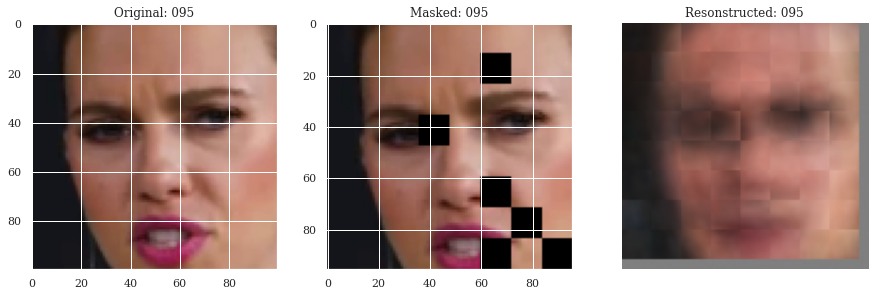

88/88 [==============================] - 19s 215ms/step - loss: 0.0077 - mae: 0.0639 - val_loss: 0.0090 - val_mae: 0.0691
Epoch 97/1000
88/88 [==============================] - 9s 97ms/step - loss: 0.0077 - mae: 0.0637 - val_loss: 0.0092 - val_mae: 0.0689
Epoch 98/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0079 - mae: 0.0647 - val_loss: 0.0091 - val_mae: 0.0687
Epoch 99/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0076 - mae: 0.0633 - val_loss: 0.0091 - val_mae: 0.0680
Epoch 100/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0077 - mae: 0.0638 - val_loss: 0.0093 - val_mae: 0.0696
Epoch 101/1000
88/88 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.0640
Idx chosen: 22


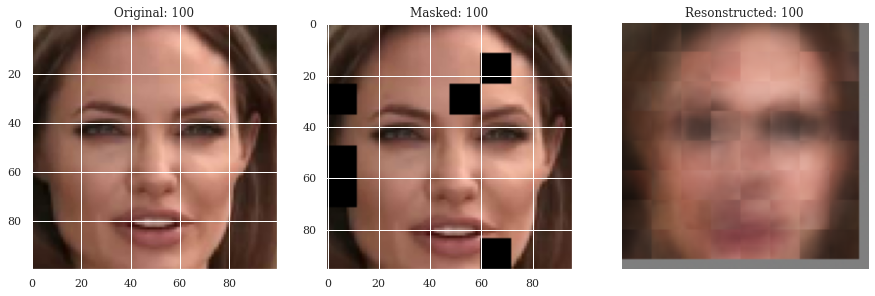

88/88 [==============================] - 19s 218ms/step - loss: 0.0077 - mae: 0.0640 - val_loss: 0.0090 - val_mae: 0.0683
Epoch 102/1000
88/88 [==============================] - 9s 98ms/step - loss: 0.0077 - mae: 0.0638 - val_loss: 0.0091 - val_mae: 0.0687
Epoch 103/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0076 - mae: 0.0631 - val_loss: 0.0094 - val_mae: 0.0706
Epoch 104/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0076 - mae: 0.0633 - val_loss: 0.0096 - val_mae: 0.0702
Epoch 105/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0076 - mae: 0.0634 - val_loss: 0.0093 - val_mae: 0.0692
Epoch 106/1000
88/88 [==============================] - ETA: 0s - loss: 0.0076 - mae: 0.0632
Idx chosen: 59


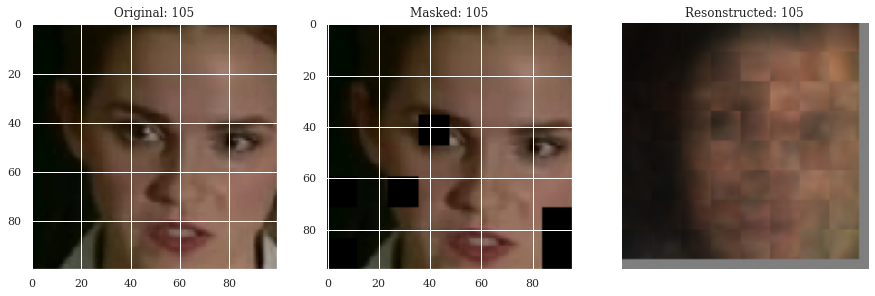

88/88 [==============================] - 9s 100ms/step - loss: 0.0076 - mae: 0.0632 - val_loss: 0.0094 - val_mae: 0.0700
Epoch 107/1000
88/88 [==============================] - 18s 210ms/step - loss: 0.0076 - mae: 0.0635 - val_loss: 0.0089 - val_mae: 0.0679
Epoch 108/1000
88/88 [==============================] - 9s 98ms/step - loss: 0.0074 - mae: 0.0628 - val_loss: 0.0093 - val_mae: 0.0686
Epoch 109/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0076 - mae: 0.0635 - val_loss: 0.0091 - val_mae: 0.0693
Epoch 110/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0076 - mae: 0.0633 - val_loss: 0.0092 - val_mae: 0.0684
Epoch 111/1000
88/88 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.0640
Idx chosen: 10


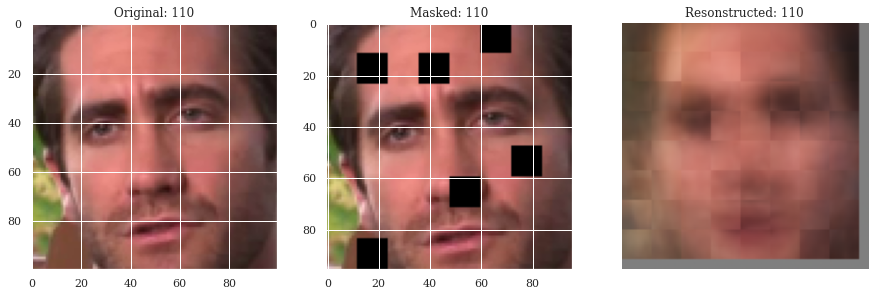

88/88 [==============================] - 9s 102ms/step - loss: 0.0077 - mae: 0.0640 - val_loss: 0.0092 - val_mae: 0.0689
Epoch 112/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0076 - mae: 0.0633 - val_loss: 0.0090 - val_mae: 0.0688
Epoch 113/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0076 - mae: 0.0631 - val_loss: 0.0089 - val_mae: 0.0678
Epoch 114/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0072 - mae: 0.0617 - val_loss: 0.0092 - val_mae: 0.0682
Epoch 115/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0075 - mae: 0.0630 - val_loss: 0.0091 - val_mae: 0.0679
Epoch 116/1000
88/88 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.0654
Idx chosen: 54


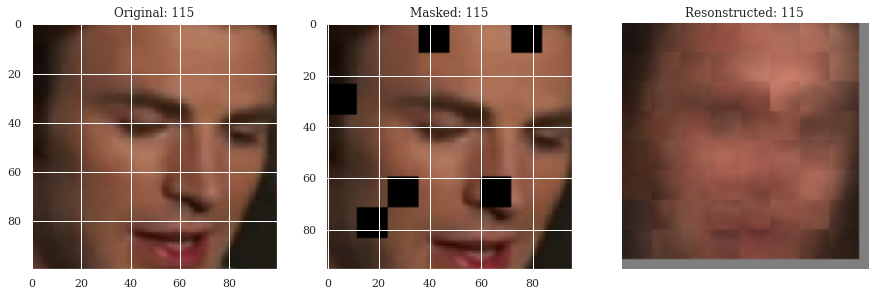

88/88 [==============================] - 9s 100ms/step - loss: 0.0080 - mae: 0.0654 - val_loss: 0.0093 - val_mae: 0.0692
Epoch 117/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0075 - mae: 0.0632 - val_loss: 0.0089 - val_mae: 0.0680
Epoch 118/1000
88/88 [==============================] - 19s 212ms/step - loss: 0.0074 - mae: 0.0624 - val_loss: 0.0089 - val_mae: 0.0673
Epoch 119/1000
88/88 [==============================] - 9s 98ms/step - loss: 0.0073 - mae: 0.0622 - val_loss: 0.0089 - val_mae: 0.0677
Epoch 120/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0073 - mae: 0.0622 - val_loss: 0.0091 - val_mae: 0.0683
Epoch 121/1000
88/88 [==============================] - ETA: 0s - loss: 0.0074 - mae: 0.0624
Idx chosen: 52


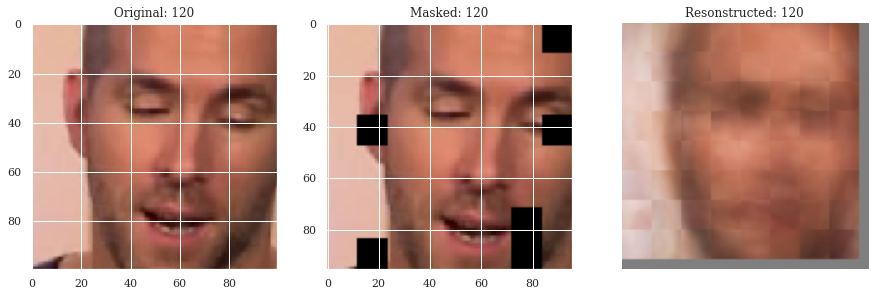

88/88 [==============================] - 9s 100ms/step - loss: 0.0074 - mae: 0.0624 - val_loss: 0.0091 - val_mae: 0.0684
Epoch 122/1000
88/88 [==============================] - 18s 211ms/step - loss: 0.0074 - mae: 0.0625 - val_loss: 0.0087 - val_mae: 0.0668
Epoch 123/1000
88/88 [==============================] - 18s 210ms/step - loss: 0.0072 - mae: 0.0617 - val_loss: 0.0087 - val_mae: 0.0666
Epoch 124/1000
88/88 [==============================] - 9s 100ms/step - loss: 0.0073 - mae: 0.0619 - val_loss: 0.0089 - val_mae: 0.0675
Epoch 125/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0074 - mae: 0.0626 - val_loss: 0.0090 - val_mae: 0.0683
Epoch 126/1000
88/88 [==============================] - ETA: 0s - loss: 0.0073 - mae: 0.0623
Idx chosen: 11


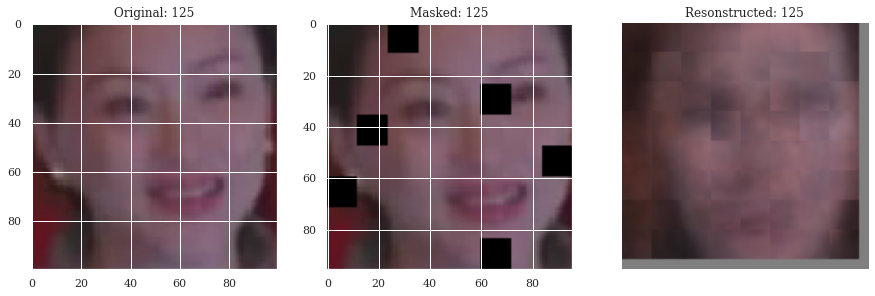

88/88 [==============================] - 9s 100ms/step - loss: 0.0073 - mae: 0.0623 - val_loss: 0.0089 - val_mae: 0.0680
Epoch 127/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0075 - mae: 0.0630 - val_loss: 0.0089 - val_mae: 0.0680
Epoch 128/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0074 - mae: 0.0626 - val_loss: 0.0087 - val_mae: 0.0668
Epoch 129/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0072 - mae: 0.0617 - val_loss: 0.0088 - val_mae: 0.0666
Epoch 130/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0073 - mae: 0.0622 - val_loss: 0.0087 - val_mae: 0.0675
Epoch 131/1000
88/88 [==============================] - ETA: 0s - loss: 0.0071 - mae: 0.0613
Idx chosen: 8


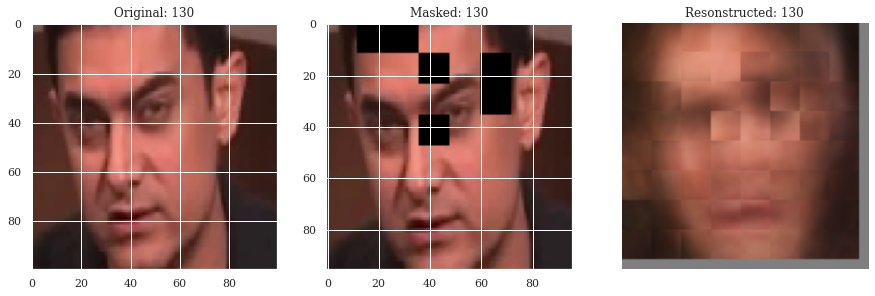

88/88 [==============================] - 19s 216ms/step - loss: 0.0071 - mae: 0.0613 - val_loss: 0.0086 - val_mae: 0.0665
Epoch 132/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0072 - mae: 0.0614 - val_loss: 0.0087 - val_mae: 0.0666
Epoch 133/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0072 - mae: 0.0619 - val_loss: 0.0088 - val_mae: 0.0677
Epoch 134/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0073 - mae: 0.0620 - val_loss: 0.0089 - val_mae: 0.0676
Epoch 135/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0073 - mae: 0.0620 - val_loss: 0.0092 - val_mae: 0.0691
Epoch 136/1000
88/88 [==============================] - ETA: 0s - loss: 0.0072 - mae: 0.0619
Idx chosen: 15


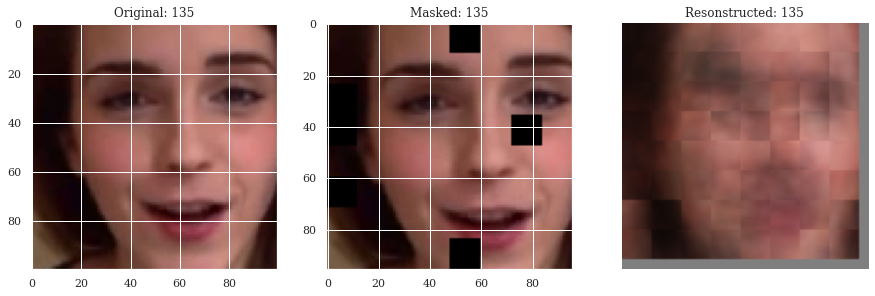

88/88 [==============================] - 9s 100ms/step - loss: 0.0072 - mae: 0.0619 - val_loss: 0.0092 - val_mae: 0.0683
Epoch 137/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0074 - mae: 0.0630 - val_loss: 0.0091 - val_mae: 0.0684
Epoch 138/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0073 - mae: 0.0621 - val_loss: 0.0092 - val_mae: 0.0682
Epoch 139/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0073 - mae: 0.0622 - val_loss: 0.0089 - val_mae: 0.0673
Epoch 140/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0073 - mae: 0.0619 - val_loss: 0.0090 - val_mae: 0.0675
Epoch 141/1000
88/88 [==============================] - ETA: 0s - loss: 0.0071 - mae: 0.0616
Idx chosen: 49


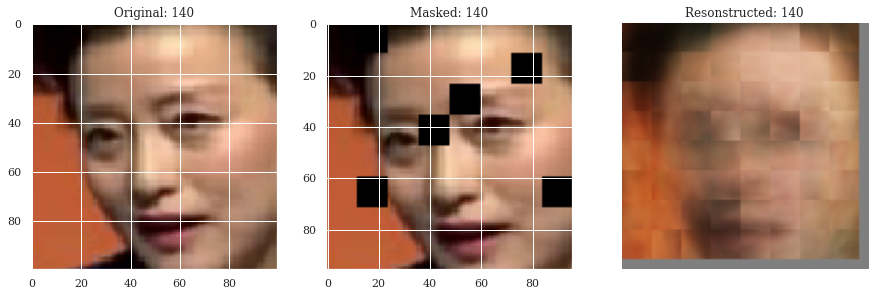

88/88 [==============================] - 9s 100ms/step - loss: 0.0071 - mae: 0.0616 - val_loss: 0.0090 - val_mae: 0.0692
Epoch 142/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0071 - mae: 0.0613 - val_loss: 0.0089 - val_mae: 0.0678
Epoch 143/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0073 - mae: 0.0624 - val_loss: 0.0090 - val_mae: 0.0681
Epoch 144/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0072 - mae: 0.0619 - val_loss: 0.0087 - val_mae: 0.0660
Epoch 145/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0072 - mae: 0.0618 - val_loss: 0.0089 - val_mae: 0.0678
Epoch 146/1000
88/88 [==============================] - ETA: 0s - loss: 0.0074 - mae: 0.0628
Idx chosen: 21


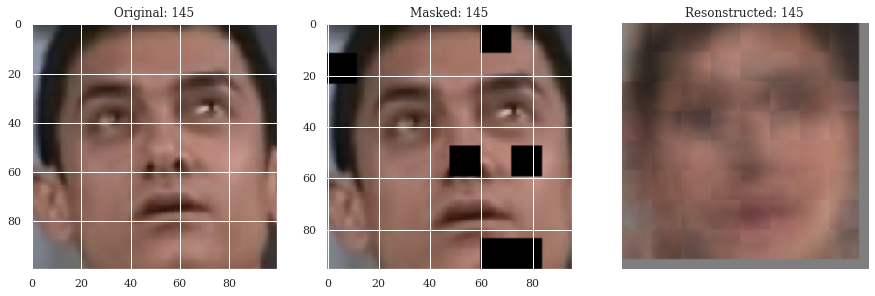

88/88 [==============================] - 9s 100ms/step - loss: 0.0074 - mae: 0.0628 - val_loss: 0.0093 - val_mae: 0.0690
Epoch 147/1000
88/88 [==============================] - 18s 209ms/step - loss: 0.0073 - mae: 0.0619 - val_loss: 0.0086 - val_mae: 0.0666
Epoch 148/1000
88/88 [==============================] - 9s 97ms/step - loss: 0.0071 - mae: 0.0613 - val_loss: 0.0088 - val_mae: 0.0671
Epoch 149/1000
88/88 [==============================] - 19s 213ms/step - loss: 0.0070 - mae: 0.0610 - val_loss: 0.0085 - val_mae: 0.0658
Epoch 150/1000
88/88 [==============================] - 9s 100ms/step - loss: 0.0070 - mae: 0.0608 - val_loss: 0.0087 - val_mae: 0.0669
Epoch 151/1000
88/88 [==============================] - ETA: 0s - loss: 0.0071 - mae: 0.0614
Idx chosen: 45


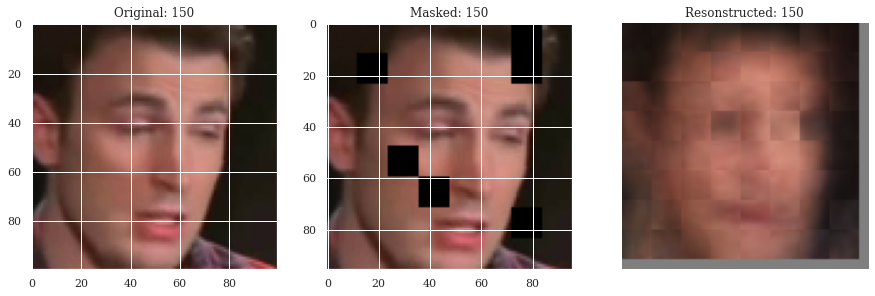

88/88 [==============================] - 9s 100ms/step - loss: 0.0071 - mae: 0.0614 - val_loss: 0.0086 - val_mae: 0.0669
Epoch 152/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0072 - mae: 0.0615 - val_loss: 0.0092 - val_mae: 0.0697
Epoch 153/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0070 - mae: 0.0609 - val_loss: 0.0087 - val_mae: 0.0672
Epoch 154/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0071 - mae: 0.0614 - val_loss: 0.0087 - val_mae: 0.0668
Epoch 155/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0071 - mae: 0.0614 - val_loss: 0.0086 - val_mae: 0.0659
Epoch 156/1000
88/88 [==============================] - ETA: 0s - loss: 0.0071 - mae: 0.0612
Idx chosen: 19


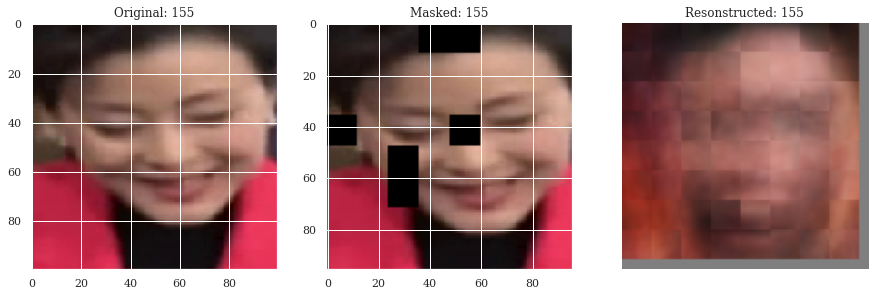

88/88 [==============================] - 9s 100ms/step - loss: 0.0071 - mae: 0.0612 - val_loss: 0.0087 - val_mae: 0.0675
Epoch 157/1000
88/88 [==============================] - 18s 210ms/step - loss: 0.0070 - mae: 0.0605 - val_loss: 0.0083 - val_mae: 0.0650
Epoch 158/1000
88/88 [==============================] - 9s 100ms/step - loss: 0.0069 - mae: 0.0607 - val_loss: 0.0087 - val_mae: 0.0665
Epoch 159/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0069 - mae: 0.0604 - val_loss: 0.0085 - val_mae: 0.0660
Epoch 160/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0070 - mae: 0.0607 - val_loss: 0.0086 - val_mae: 0.0662
Epoch 161/1000
88/88 [==============================] - ETA: 0s - loss: 0.0068 - mae: 0.0598
Idx chosen: 49


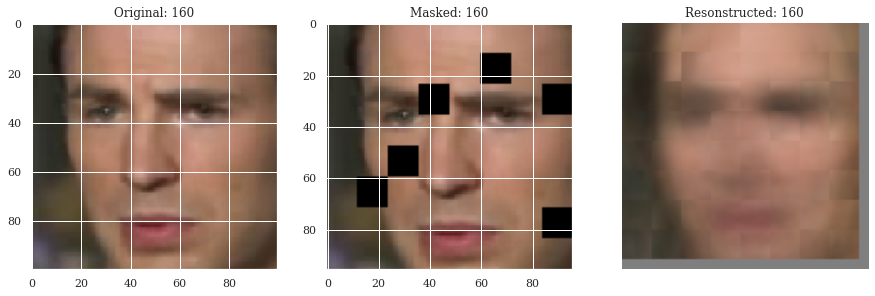

88/88 [==============================] - 9s 102ms/step - loss: 0.0068 - mae: 0.0598 - val_loss: 0.0086 - val_mae: 0.0660
Epoch 162/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0069 - mae: 0.0603 - val_loss: 0.0088 - val_mae: 0.0665
Epoch 163/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0071 - mae: 0.0612 - val_loss: 0.0091 - val_mae: 0.0691
Epoch 164/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0070 - mae: 0.0607 - val_loss: 0.0087 - val_mae: 0.0668
Epoch 165/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0070 - mae: 0.0607 - val_loss: 0.0089 - val_mae: 0.0676
Epoch 166/1000
88/88 [==============================] - ETA: 0s - loss: 0.0069 - mae: 0.0602
Idx chosen: 34


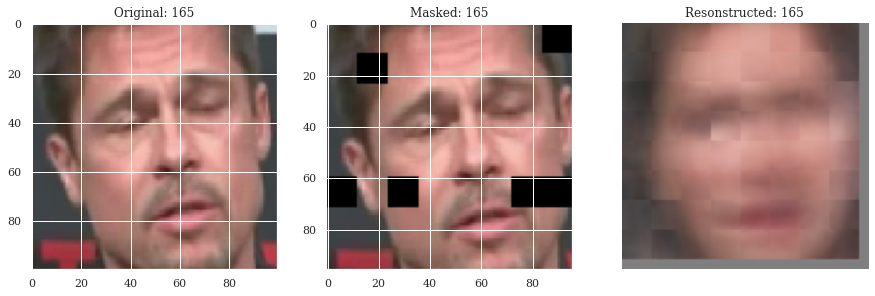

88/88 [==============================] - 19s 217ms/step - loss: 0.0069 - mae: 0.0602 - val_loss: 0.0083 - val_mae: 0.0645
Epoch 167/1000
88/88 [==============================] - 9s 100ms/step - loss: 0.0067 - mae: 0.0596 - val_loss: 0.0087 - val_mae: 0.0672
Epoch 168/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0067 - mae: 0.0591 - val_loss: 0.0083 - val_mae: 0.0649
Epoch 169/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0068 - mae: 0.0598 - val_loss: 0.0085 - val_mae: 0.0656
Epoch 170/1000
88/88 [==============================] - 18s 209ms/step - loss: 0.0068 - mae: 0.0597 - val_loss: 0.0082 - val_mae: 0.0648
Epoch 171/1000
88/88 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.0596
Idx chosen: 7


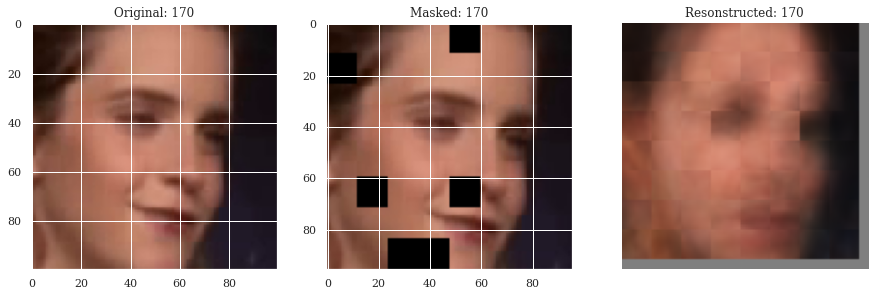

88/88 [==============================] - 9s 104ms/step - loss: 0.0067 - mae: 0.0596 - val_loss: 0.0087 - val_mae: 0.0667
Epoch 172/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0069 - mae: 0.0600 - val_loss: 0.0083 - val_mae: 0.0654
Epoch 173/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0067 - mae: 0.0594 - val_loss: 0.0085 - val_mae: 0.0660
Epoch 174/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0068 - mae: 0.0597 - val_loss: 0.0085 - val_mae: 0.0652
Epoch 175/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0069 - mae: 0.0602 - val_loss: 0.0085 - val_mae: 0.0664
Epoch 176/1000
88/88 [==============================] - ETA: 0s - loss: 0.0068 - mae: 0.0599
Idx chosen: 20


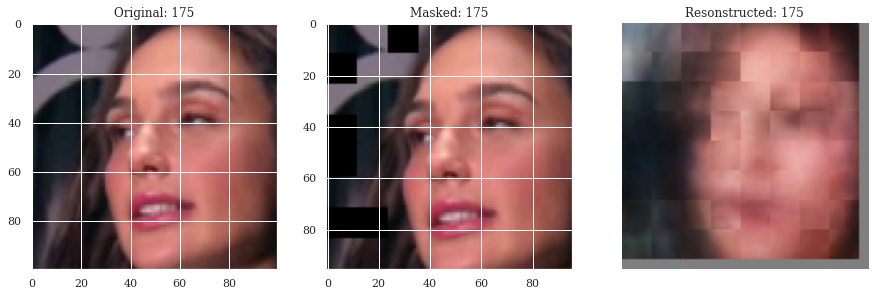

88/88 [==============================] - 9s 100ms/step - loss: 0.0068 - mae: 0.0599 - val_loss: 0.0083 - val_mae: 0.0648
Epoch 177/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0067 - mae: 0.0594 - val_loss: 0.0085 - val_mae: 0.0653
Epoch 178/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0069 - mae: 0.0602 - val_loss: 0.0087 - val_mae: 0.0664
Epoch 179/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0069 - mae: 0.0605 - val_loss: 0.0084 - val_mae: 0.0654
Epoch 180/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0068 - mae: 0.0597 - val_loss: 0.0085 - val_mae: 0.0654
Epoch 181/1000
88/88 [==============================] - ETA: 0s - loss: 0.0068 - mae: 0.0599
Idx chosen: 36


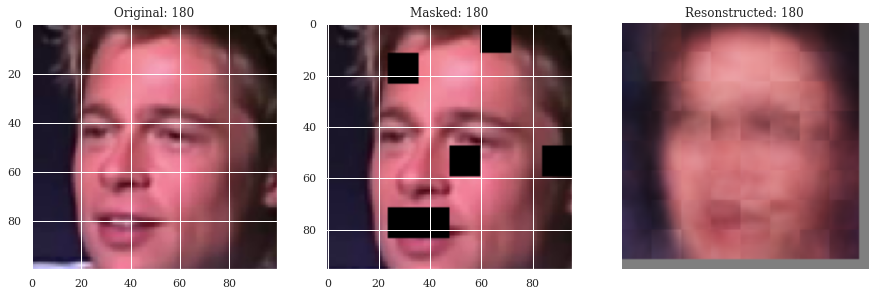

88/88 [==============================] - 9s 100ms/step - loss: 0.0068 - mae: 0.0599 - val_loss: 0.0087 - val_mae: 0.0662
Epoch 182/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0068 - mae: 0.0597 - val_loss: 0.0086 - val_mae: 0.0668
Epoch 183/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0067 - mae: 0.0593 - val_loss: 0.0083 - val_mae: 0.0650
Epoch 184/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0066 - mae: 0.0590 - val_loss: 0.0083 - val_mae: 0.0650
Epoch 185/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0068 - mae: 0.0600 - val_loss: 0.0089 - val_mae: 0.0683
Epoch 186/1000
88/88 [==============================] - ETA: 0s - loss: 0.0068 - mae: 0.0600
Idx chosen: 2


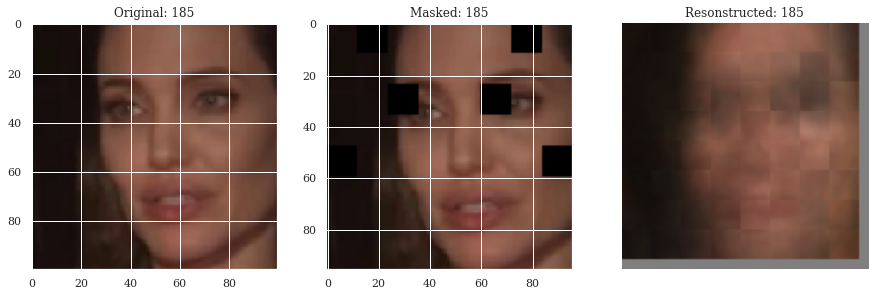

88/88 [==============================] - 9s 100ms/step - loss: 0.0068 - mae: 0.0600 - val_loss: 0.0086 - val_mae: 0.0658
Epoch 187/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0067 - mae: 0.0596 - val_loss: 0.0088 - val_mae: 0.0668
Epoch 188/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0068 - mae: 0.0598 - val_loss: 0.0086 - val_mae: 0.0665
Epoch 189/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0066 - mae: 0.0588 - val_loss: 0.0084 - val_mae: 0.0649
Epoch 190/1000
88/88 [==============================] - 18s 210ms/step - loss: 0.0065 - mae: 0.0582 - val_loss: 0.0081 - val_mae: 0.0642
Epoch 191/1000
88/88 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.0589
Idx chosen: 0


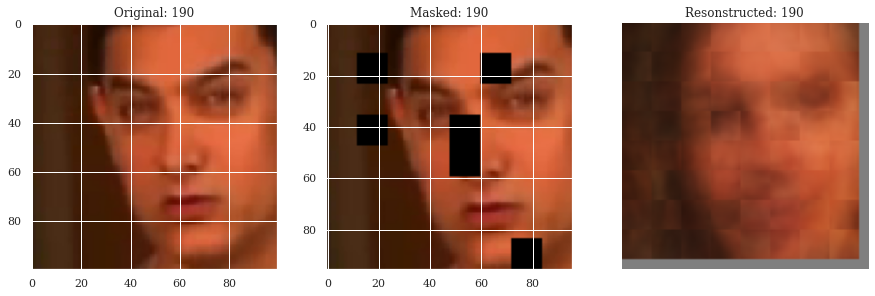

88/88 [==============================] - 9s 104ms/step - loss: 0.0066 - mae: 0.0589 - val_loss: 0.0083 - val_mae: 0.0651
Epoch 192/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0068 - mae: 0.0596 - val_loss: 0.0086 - val_mae: 0.0661
Epoch 193/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0066 - mae: 0.0589 - val_loss: 0.0083 - val_mae: 0.0652
Epoch 194/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0065 - mae: 0.0584 - val_loss: 0.0086 - val_mae: 0.0658
Epoch 195/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0067 - mae: 0.0594 - val_loss: 0.0083 - val_mae: 0.0651
Epoch 196/1000
88/88 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.0589
Idx chosen: 31


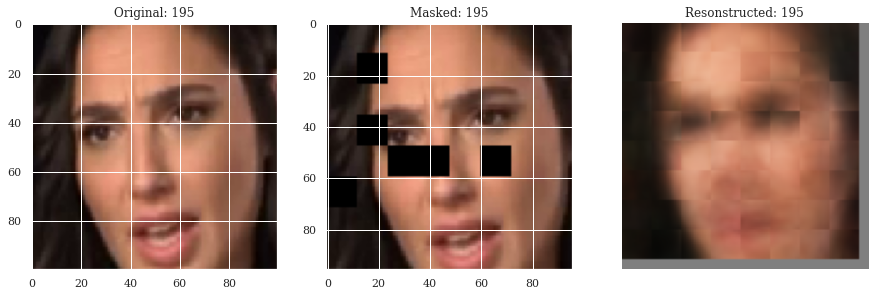

88/88 [==============================] - 9s 100ms/step - loss: 0.0066 - mae: 0.0589 - val_loss: 0.0085 - val_mae: 0.0654
Epoch 197/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0066 - mae: 0.0588 - val_loss: 0.0083 - val_mae: 0.0646
Epoch 198/1000
88/88 [==============================] - 18s 211ms/step - loss: 0.0066 - mae: 0.0590 - val_loss: 0.0080 - val_mae: 0.0645
Epoch 199/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0065 - mae: 0.0586 - val_loss: 0.0081 - val_mae: 0.0644
Epoch 200/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0064 - mae: 0.0581 - val_loss: 0.0083 - val_mae: 0.0641
Epoch 201/1000
88/88 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.0587
Idx chosen: 51


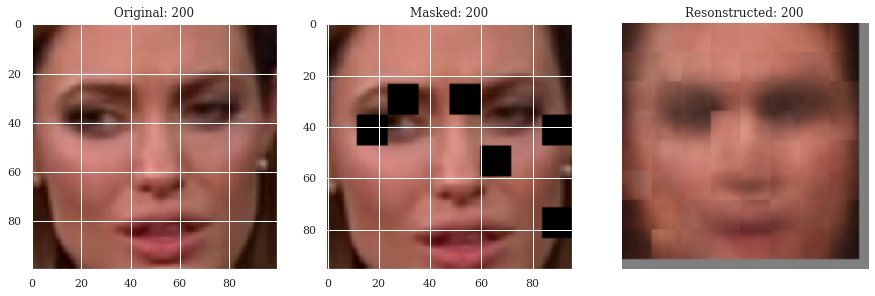

88/88 [==============================] - 9s 101ms/step - loss: 0.0066 - mae: 0.0587 - val_loss: 0.0082 - val_mae: 0.0646
Epoch 202/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0064 - mae: 0.0582 - val_loss: 0.0084 - val_mae: 0.0655
Epoch 203/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0065 - mae: 0.0586 - val_loss: 0.0083 - val_mae: 0.0652
Epoch 204/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0065 - mae: 0.0587 - val_loss: 0.0084 - val_mae: 0.0655
Epoch 205/1000
88/88 [==============================] - 9s 96ms/step - loss: 0.0065 - mae: 0.0584 - val_loss: 0.0082 - val_mae: 0.0649
Epoch 206/1000
88/88 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.0584
Idx chosen: 7


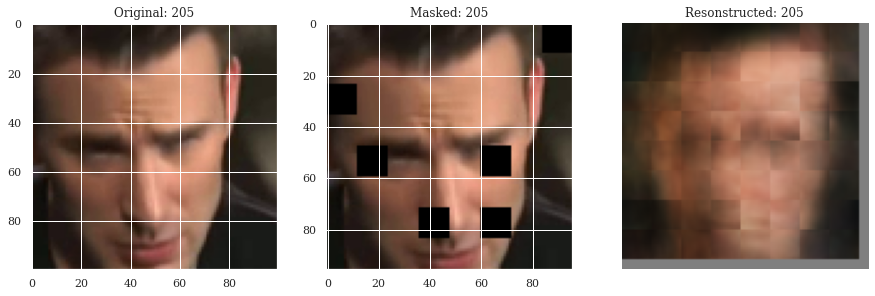

88/88 [==============================] - 9s 100ms/step - loss: 0.0065 - mae: 0.0584 - val_loss: 0.0083 - val_mae: 0.0646
Epoch 207/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0063 - mae: 0.0575 - val_loss: 0.0082 - val_mae: 0.0640
Epoch 208/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0069 - mae: 0.0600 - val_loss: 0.0088 - val_mae: 0.0676
Epoch 209/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0067 - mae: 0.0595 - val_loss: 0.0083 - val_mae: 0.0650
Epoch 210/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0064 - mae: 0.0582 - val_loss: 0.0083 - val_mae: 0.0645
Epoch 211/1000
88/88 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.0582
Idx chosen: 38


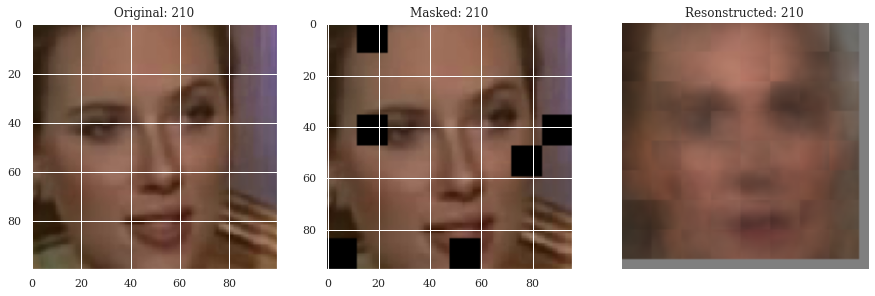

88/88 [==============================] - 9s 100ms/step - loss: 0.0065 - mae: 0.0582 - val_loss: 0.0083 - val_mae: 0.0649
Epoch 212/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0066 - mae: 0.0585 - val_loss: 0.0084 - val_mae: 0.0651
Epoch 213/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0064 - mae: 0.0580 - val_loss: 0.0082 - val_mae: 0.0652
Epoch 214/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0064 - mae: 0.0579 - val_loss: 0.0083 - val_mae: 0.0643
Epoch 215/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0065 - mae: 0.0582 - val_loss: 0.0082 - val_mae: 0.0641
Epoch 216/1000
88/88 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.0585
Idx chosen: 49


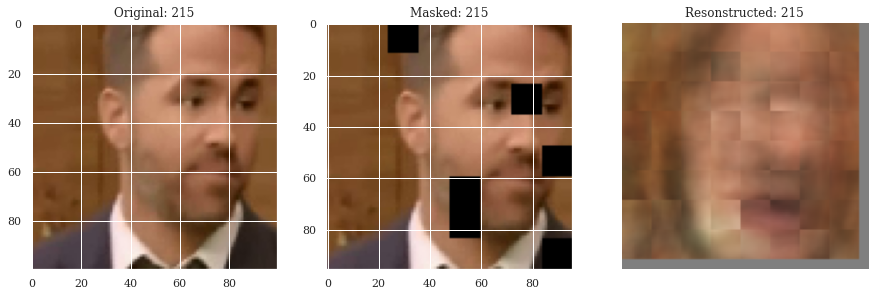

88/88 [==============================] - 9s 99ms/step - loss: 0.0065 - mae: 0.0585 - val_loss: 0.0081 - val_mae: 0.0643
Epoch 217/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0064 - mae: 0.0581 - val_loss: 0.0081 - val_mae: 0.0636
Epoch 218/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0063 - mae: 0.0575 - val_loss: 0.0084 - val_mae: 0.0641
Epoch 219/1000
88/88 [==============================] - 19s 216ms/step - loss: 0.0063 - mae: 0.0576 - val_loss: 0.0080 - val_mae: 0.0633
Epoch 220/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0063 - mae: 0.0576 - val_loss: 0.0080 - val_mae: 0.0636
Epoch 221/1000
88/88 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.0586
Idx chosen: 43


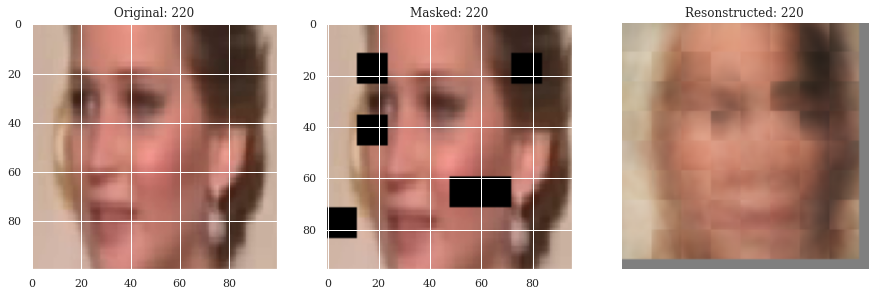

88/88 [==============================] - 9s 100ms/step - loss: 0.0065 - mae: 0.0586 - val_loss: 0.0081 - val_mae: 0.0640
Epoch 222/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0064 - mae: 0.0582 - val_loss: 0.0081 - val_mae: 0.0640
Epoch 223/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0063 - mae: 0.0578 - val_loss: 0.0082 - val_mae: 0.0655
Epoch 224/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0063 - mae: 0.0573 - val_loss: 0.0080 - val_mae: 0.0635
Epoch 225/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0063 - mae: 0.0576 - val_loss: 0.0081 - val_mae: 0.0648
Epoch 226/1000
88/88 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.0580
Idx chosen: 62


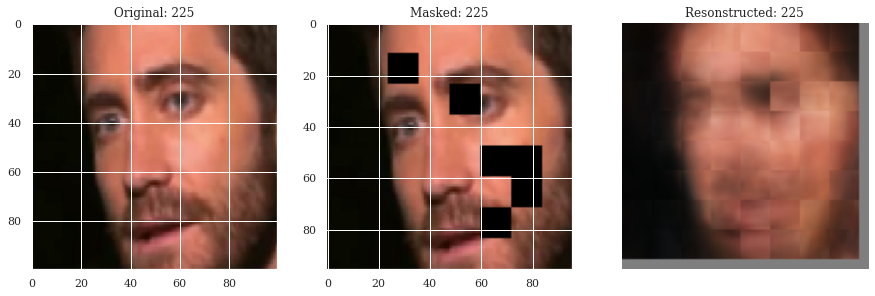

88/88 [==============================] - 9s 100ms/step - loss: 0.0064 - mae: 0.0580 - val_loss: 0.0081 - val_mae: 0.0638
Epoch 227/1000
88/88 [==============================] - 18s 208ms/step - loss: 0.0063 - mae: 0.0576 - val_loss: 0.0078 - val_mae: 0.0638
Epoch 228/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0063 - mae: 0.0577 - val_loss: 0.0083 - val_mae: 0.0646
Epoch 229/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0063 - mae: 0.0576 - val_loss: 0.0082 - val_mae: 0.0640
Epoch 230/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0063 - mae: 0.0574 - val_loss: 0.0080 - val_mae: 0.0631
Epoch 231/1000
88/88 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.0578
Idx chosen: 30


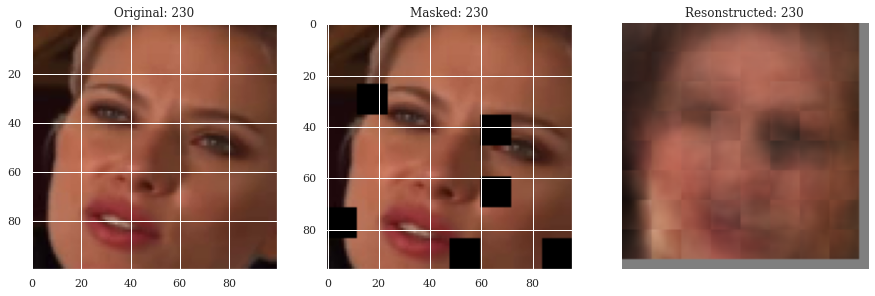

88/88 [==============================] - 9s 100ms/step - loss: 0.0064 - mae: 0.0578 - val_loss: 0.0082 - val_mae: 0.0652
Epoch 232/1000
88/88 [==============================] - 19s 213ms/step - loss: 0.0063 - mae: 0.0576 - val_loss: 0.0078 - val_mae: 0.0630
Epoch 233/1000
88/88 [==============================] - 19s 213ms/step - loss: 0.0063 - mae: 0.0572 - val_loss: 0.0078 - val_mae: 0.0627
Epoch 234/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0062 - mae: 0.0570 - val_loss: 0.0082 - val_mae: 0.0641
Epoch 235/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0062 - mae: 0.0572 - val_loss: 0.0079 - val_mae: 0.0639
Epoch 236/1000
88/88 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.0572
Idx chosen: 4


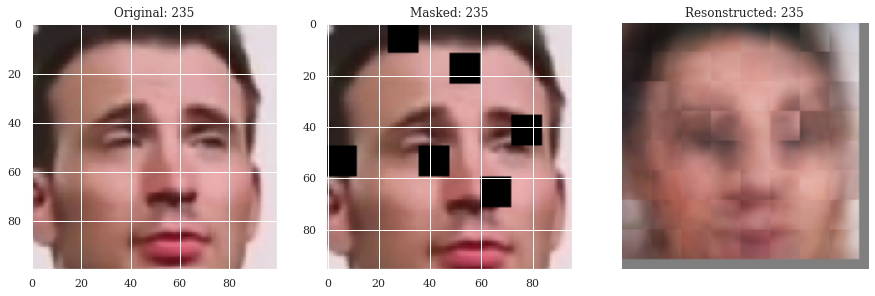

88/88 [==============================] - 9s 101ms/step - loss: 0.0062 - mae: 0.0572 - val_loss: 0.0081 - val_mae: 0.0645
Epoch 237/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0062 - mae: 0.0572 - val_loss: 0.0080 - val_mae: 0.0637
Epoch 238/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0063 - mae: 0.0573 - val_loss: 0.0080 - val_mae: 0.0639
Epoch 239/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0063 - mae: 0.0576 - val_loss: 0.0082 - val_mae: 0.0641
Epoch 240/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0063 - mae: 0.0574 - val_loss: 0.0082 - val_mae: 0.0640
Epoch 241/1000
88/88 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.0574
Idx chosen: 2


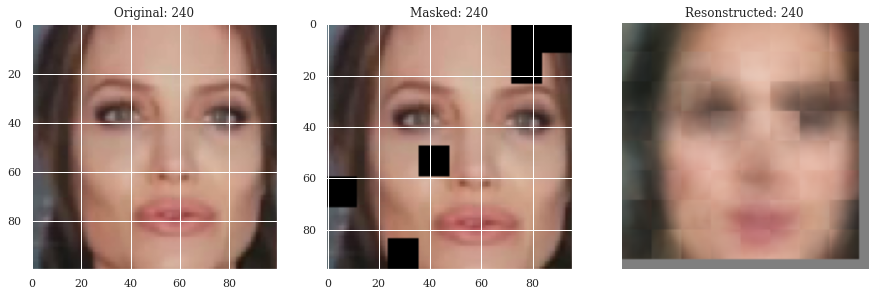

88/88 [==============================] - 9s 100ms/step - loss: 0.0063 - mae: 0.0574 - val_loss: 0.0081 - val_mae: 0.0633
Epoch 242/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0062 - mae: 0.0571 - val_loss: 0.0082 - val_mae: 0.0641
Epoch 243/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0063 - mae: 0.0573 - val_loss: 0.0080 - val_mae: 0.0633
Epoch 244/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0061 - mae: 0.0567 - val_loss: 0.0080 - val_mae: 0.0638
Epoch 245/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0062 - mae: 0.0569 - val_loss: 0.0079 - val_mae: 0.0632
Epoch 246/1000
88/88 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.0570
Idx chosen: 16


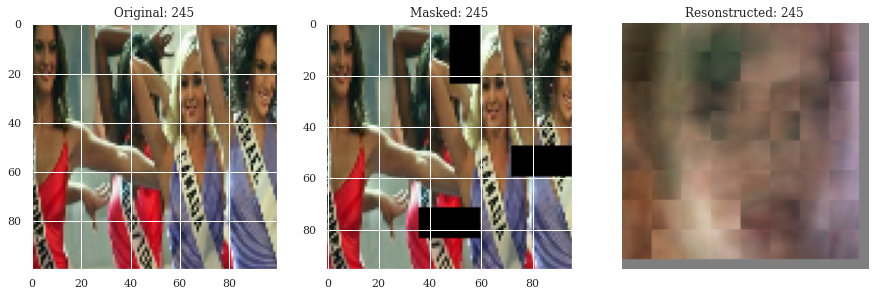

88/88 [==============================] - 9s 101ms/step - loss: 0.0062 - mae: 0.0570 - val_loss: 0.0081 - val_mae: 0.0643
Epoch 247/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0062 - mae: 0.0570 - val_loss: 0.0082 - val_mae: 0.0655
Epoch 248/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0063 - mae: 0.0575 - val_loss: 0.0081 - val_mae: 0.0636
Epoch 249/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0062 - mae: 0.0569 - val_loss: 0.0082 - val_mae: 0.0643
Epoch 250/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0064 - mae: 0.0581 - val_loss: 0.0080 - val_mae: 0.0632
Epoch 251/1000
88/88 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.0566
Idx chosen: 44


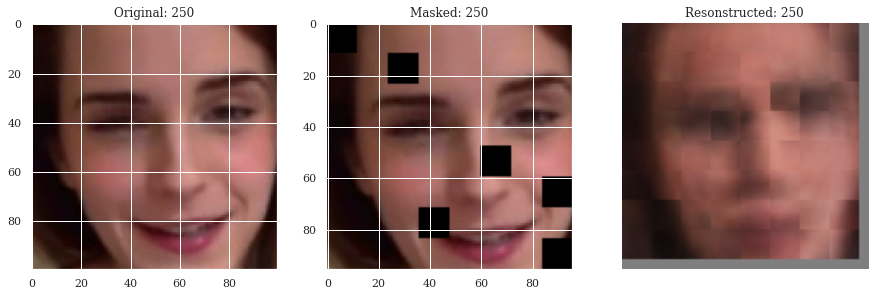

88/88 [==============================] - 9s 101ms/step - loss: 0.0061 - mae: 0.0566 - val_loss: 0.0080 - val_mae: 0.0639
Epoch 252/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0062 - mae: 0.0569 - val_loss: 0.0078 - val_mae: 0.0627
Epoch 253/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0062 - mae: 0.0569 - val_loss: 0.0081 - val_mae: 0.0640
Epoch 254/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0061 - mae: 0.0564 - val_loss: 0.0078 - val_mae: 0.0632
Epoch 255/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0062 - mae: 0.0571 - val_loss: 0.0081 - val_mae: 0.0636
Epoch 256/1000
88/88 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.0568
Idx chosen: 11


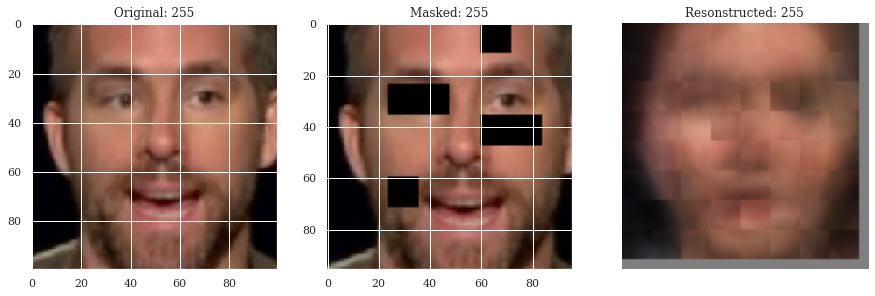

88/88 [==============================] - 9s 101ms/step - loss: 0.0061 - mae: 0.0568 - val_loss: 0.0078 - val_mae: 0.0626
Epoch 257/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0062 - mae: 0.0565 - val_loss: 0.0080 - val_mae: 0.0630
Epoch 258/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0061 - mae: 0.0563 - val_loss: 0.0080 - val_mae: 0.0634
Epoch 259/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0063 - mae: 0.0573 - val_loss: 0.0078 - val_mae: 0.0627
Epoch 260/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0061 - mae: 0.0564 - val_loss: 0.0078 - val_mae: 0.0628
Epoch 261/1000
88/88 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.0563
Idx chosen: 39


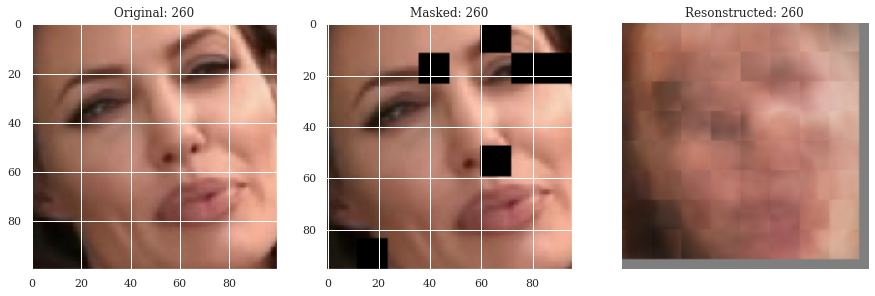

88/88 [==============================] - 9s 100ms/step - loss: 0.0061 - mae: 0.0563 - val_loss: 0.0079 - val_mae: 0.0630
Epoch 262/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0061 - mae: 0.0566 - val_loss: 0.0079 - val_mae: 0.0629
Epoch 263/1000
88/88 [==============================] - 18s 209ms/step - loss: 0.0061 - mae: 0.0565 - val_loss: 0.0077 - val_mae: 0.0627
Epoch 264/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0062 - mae: 0.0569 - val_loss: 0.0080 - val_mae: 0.0635
Epoch 265/1000
88/88 [==============================] - 18s 211ms/step - loss: 0.0062 - mae: 0.0568 - val_loss: 0.0077 - val_mae: 0.0623
Epoch 266/1000
88/88 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.0560
Idx chosen: 32


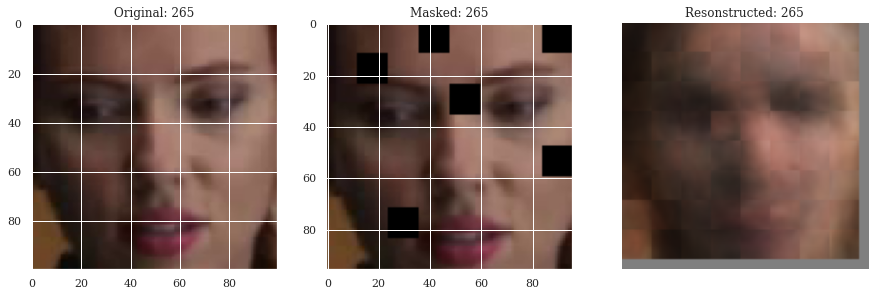

88/88 [==============================] - 9s 104ms/step - loss: 0.0060 - mae: 0.0560 - val_loss: 0.0079 - val_mae: 0.0628
Epoch 267/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0061 - mae: 0.0565 - val_loss: 0.0077 - val_mae: 0.0626
Epoch 268/1000
88/88 [==============================] - 18s 205ms/step - loss: 0.0060 - mae: 0.0561 - val_loss: 0.0077 - val_mae: 0.0621
Epoch 269/1000
88/88 [==============================] - 9s 98ms/step - loss: 0.0060 - mae: 0.0562 - val_loss: 0.0079 - val_mae: 0.0628
Epoch 270/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0061 - mae: 0.0564 - val_loss: 0.0079 - val_mae: 0.0640
Epoch 271/1000
88/88 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.0563
Idx chosen: 11


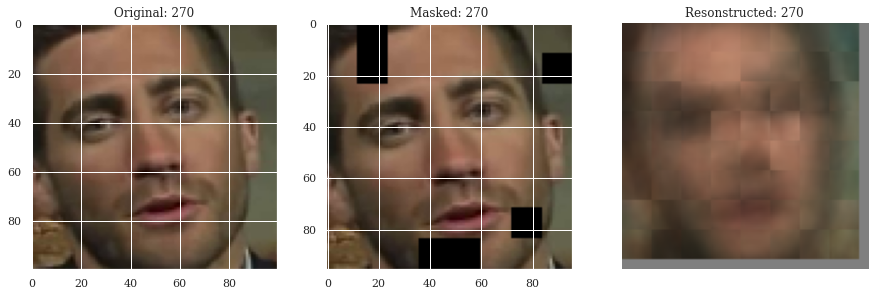

88/88 [==============================] - 9s 102ms/step - loss: 0.0060 - mae: 0.0563 - val_loss: 0.0080 - val_mae: 0.0631
Epoch 272/1000
88/88 [==============================] - 9s 96ms/step - loss: 0.0060 - mae: 0.0561 - val_loss: 0.0081 - val_mae: 0.0645
Epoch 273/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0061 - mae: 0.0569 - val_loss: 0.0079 - val_mae: 0.0628
Epoch 274/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0062 - mae: 0.0569 - val_loss: 0.0079 - val_mae: 0.0626
Epoch 275/1000
88/88 [==============================] - 18s 211ms/step - loss: 0.0061 - mae: 0.0567 - val_loss: 0.0075 - val_mae: 0.0615
Epoch 276/1000
88/88 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.0564
Idx chosen: 56


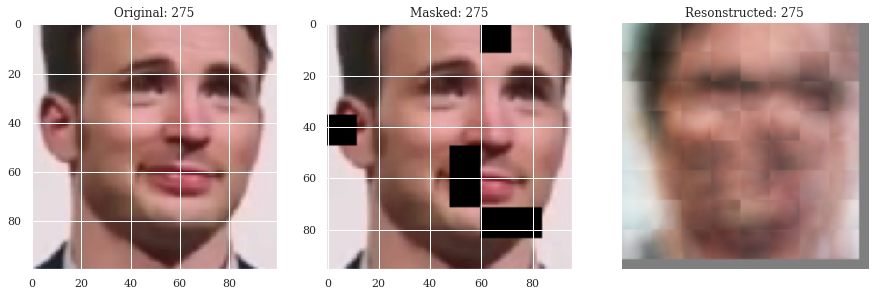

88/88 [==============================] - 9s 103ms/step - loss: 0.0061 - mae: 0.0564 - val_loss: 0.0077 - val_mae: 0.0620
Epoch 277/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0060 - mae: 0.0560 - val_loss: 0.0077 - val_mae: 0.0619
Epoch 278/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0060 - mae: 0.0560 - val_loss: 0.0077 - val_mae: 0.0621
Epoch 279/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0059 - mae: 0.0555 - val_loss: 0.0078 - val_mae: 0.0625
Epoch 280/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0060 - mae: 0.0559 - val_loss: 0.0079 - val_mae: 0.0628
Epoch 281/1000
88/88 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.0566
Idx chosen: 22


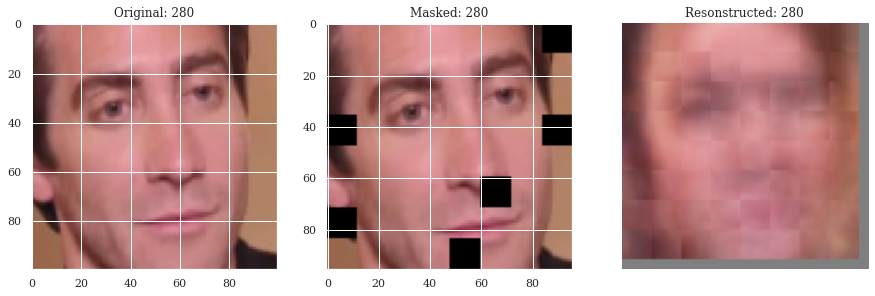

88/88 [==============================] - 9s 100ms/step - loss: 0.0061 - mae: 0.0566 - val_loss: 0.0082 - val_mae: 0.0643
Epoch 282/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0061 - mae: 0.0568 - val_loss: 0.0080 - val_mae: 0.0640
Epoch 283/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0059 - mae: 0.0559 - val_loss: 0.0079 - val_mae: 0.0628
Epoch 284/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0060 - mae: 0.0563 - val_loss: 0.0079 - val_mae: 0.0626
Epoch 285/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0060 - mae: 0.0557 - val_loss: 0.0078 - val_mae: 0.0627
Epoch 286/1000
88/88 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.0557
Idx chosen: 61


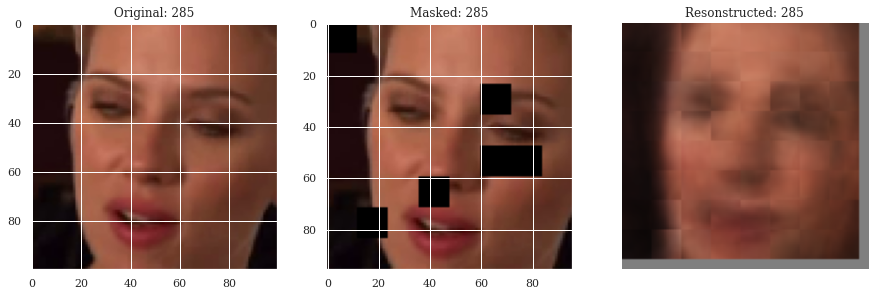

88/88 [==============================] - 9s 100ms/step - loss: 0.0059 - mae: 0.0557 - val_loss: 0.0076 - val_mae: 0.0622
Epoch 287/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0060 - mae: 0.0560 - val_loss: 0.0077 - val_mae: 0.0622
Epoch 288/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0061 - mae: 0.0563 - val_loss: 0.0077 - val_mae: 0.0621
Epoch 289/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0059 - mae: 0.0557 - val_loss: 0.0078 - val_mae: 0.0630
Epoch 290/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0061 - mae: 0.0566 - val_loss: 0.0078 - val_mae: 0.0624
Epoch 291/1000
88/88 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.0553
Idx chosen: 25


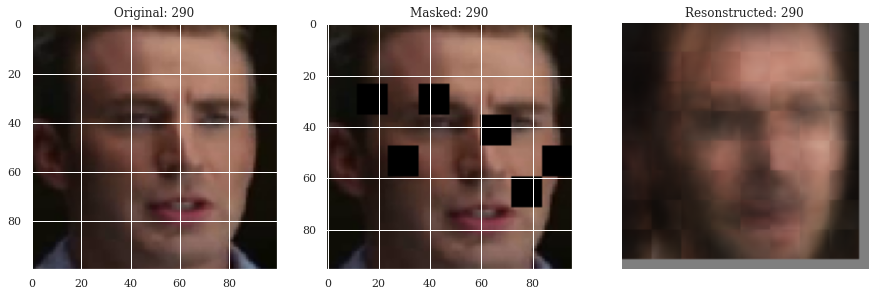

88/88 [==============================] - 9s 100ms/step - loss: 0.0058 - mae: 0.0553 - val_loss: 0.0077 - val_mae: 0.0619
Epoch 292/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0059 - mae: 0.0552 - val_loss: 0.0078 - val_mae: 0.0623
Epoch 293/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0059 - mae: 0.0553 - val_loss: 0.0080 - val_mae: 0.0635
Epoch 294/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0061 - mae: 0.0565 - val_loss: 0.0079 - val_mae: 0.0631
Epoch 295/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0061 - mae: 0.0567 - val_loss: 0.0077 - val_mae: 0.0625
Epoch 296/1000
88/88 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.0559
Idx chosen: 60


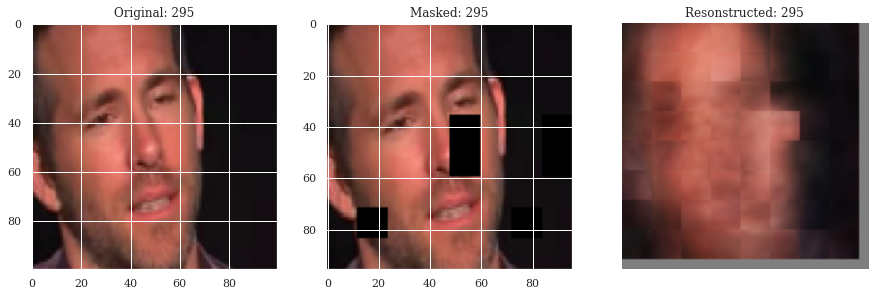

88/88 [==============================] - 9s 100ms/step - loss: 0.0060 - mae: 0.0559 - val_loss: 0.0078 - val_mae: 0.0624
Epoch 297/1000
88/88 [==============================] - 18s 210ms/step - loss: 0.0059 - mae: 0.0555 - val_loss: 0.0075 - val_mae: 0.0613
Epoch 298/1000
88/88 [==============================] - 9s 97ms/step - loss: 0.0060 - mae: 0.0561 - val_loss: 0.0077 - val_mae: 0.0620
Epoch 299/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0059 - mae: 0.0553 - val_loss: 0.0079 - val_mae: 0.0626
Epoch 300/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0059 - mae: 0.0557 - val_loss: 0.0080 - val_mae: 0.0634
Epoch 301/1000
88/88 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.0555
Idx chosen: 16


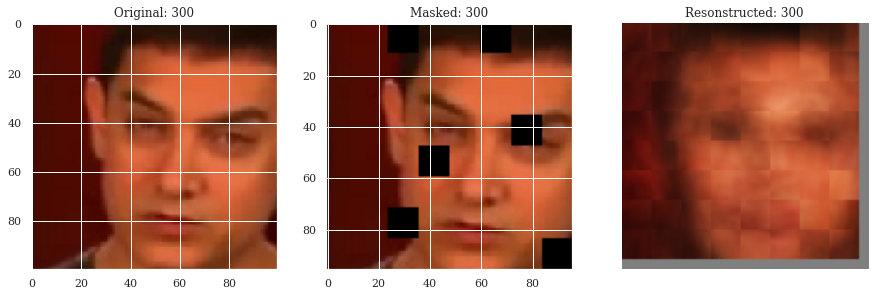

88/88 [==============================] - 9s 100ms/step - loss: 0.0059 - mae: 0.0555 - val_loss: 0.0075 - val_mae: 0.0615
Epoch 302/1000
88/88 [==============================] - 9s 98ms/step - loss: 0.0059 - mae: 0.0555 - val_loss: 0.0077 - val_mae: 0.0623
Epoch 303/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0058 - mae: 0.0554 - val_loss: 0.0076 - val_mae: 0.0616
Epoch 304/1000
88/88 [==============================] - 9s 96ms/step - loss: 0.0058 - mae: 0.0548 - val_loss: 0.0076 - val_mae: 0.0618
Epoch 305/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0059 - mae: 0.0555 - val_loss: 0.0077 - val_mae: 0.0619
Epoch 306/1000
88/88 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.0555
Idx chosen: 17


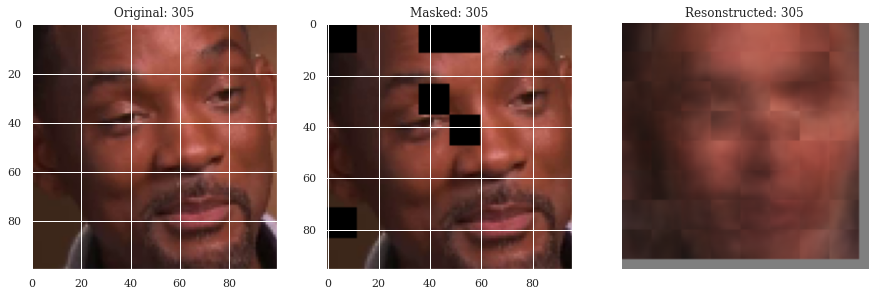

88/88 [==============================] - 9s 100ms/step - loss: 0.0059 - mae: 0.0555 - val_loss: 0.0076 - val_mae: 0.0621
Epoch 307/1000
88/88 [==============================] - 9s 96ms/step - loss: 0.0057 - mae: 0.0548 - val_loss: 0.0075 - val_mae: 0.0616
Epoch 308/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0059 - mae: 0.0557 - val_loss: 0.0075 - val_mae: 0.0612
Epoch 309/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0057 - mae: 0.0547 - val_loss: 0.0076 - val_mae: 0.0617
Epoch 310/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0058 - mae: 0.0550 - val_loss: 0.0075 - val_mae: 0.0617
Epoch 311/1000
88/88 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.0552
Idx chosen: 61


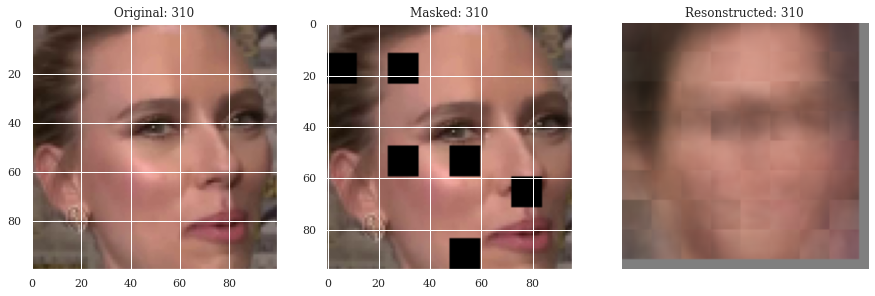

88/88 [==============================] - 9s 101ms/step - loss: 0.0058 - mae: 0.0552 - val_loss: 0.0075 - val_mae: 0.0616
Epoch 312/1000
88/88 [==============================] - 9s 96ms/step - loss: 0.0058 - mae: 0.0550 - val_loss: 0.0077 - val_mae: 0.0622
Epoch 313/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0058 - mae: 0.0551 - val_loss: 0.0079 - val_mae: 0.0630
Epoch 314/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0059 - mae: 0.0553 - val_loss: 0.0077 - val_mae: 0.0627
Epoch 315/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0059 - mae: 0.0554 - val_loss: 0.0079 - val_mae: 0.0627
Epoch 316/1000
88/88 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.0554
Idx chosen: 57


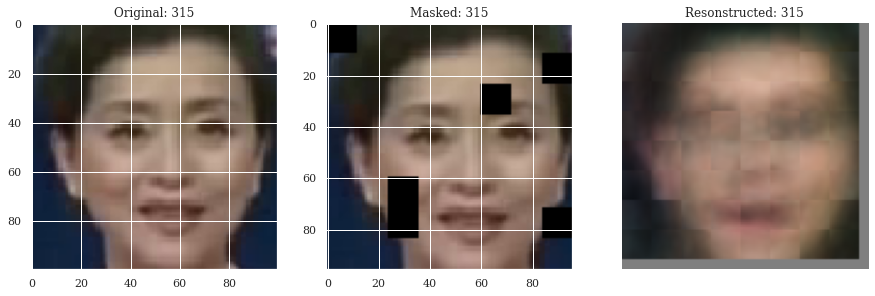

88/88 [==============================] - 9s 100ms/step - loss: 0.0059 - mae: 0.0554 - val_loss: 0.0075 - val_mae: 0.0609
Epoch 317/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0059 - mae: 0.0557 - val_loss: 0.0076 - val_mae: 0.0617
Epoch 318/1000
88/88 [==============================] - 19s 213ms/step - loss: 0.0058 - mae: 0.0549 - val_loss: 0.0074 - val_mae: 0.0610
Epoch 319/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0057 - mae: 0.0547 - val_loss: 0.0078 - val_mae: 0.0625
Epoch 320/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0058 - mae: 0.0551 - val_loss: 0.0077 - val_mae: 0.0620
Epoch 321/1000
88/88 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.0551
Idx chosen: 34


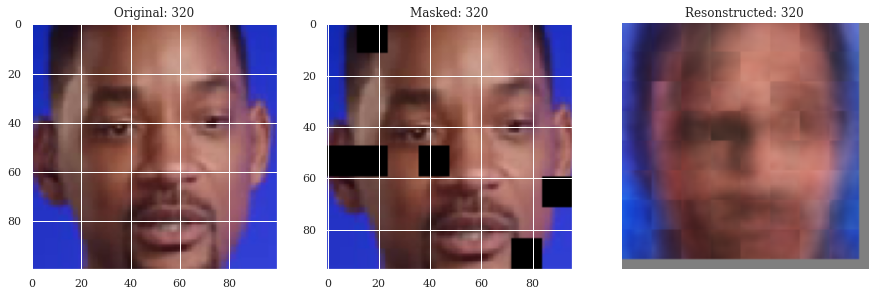

88/88 [==============================] - 9s 101ms/step - loss: 0.0058 - mae: 0.0551 - val_loss: 0.0075 - val_mae: 0.0611
Epoch 322/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0058 - mae: 0.0550 - val_loss: 0.0078 - val_mae: 0.0622
Epoch 323/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0058 - mae: 0.0551 - val_loss: 0.0074 - val_mae: 0.0610
Epoch 324/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0059 - mae: 0.0556 - val_loss: 0.0076 - val_mae: 0.0615
Epoch 325/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0058 - mae: 0.0552 - val_loss: 0.0076 - val_mae: 0.0619
Epoch 326/1000
88/88 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.0554
Idx chosen: 2


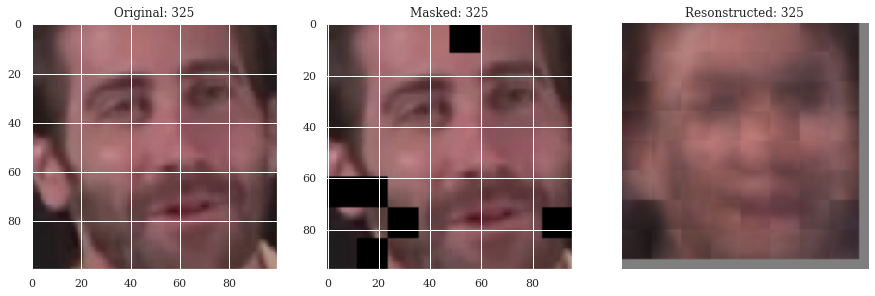

88/88 [==============================] - 9s 100ms/step - loss: 0.0058 - mae: 0.0554 - val_loss: 0.0077 - val_mae: 0.0623
Epoch 327/1000
88/88 [==============================] - 9s 96ms/step - loss: 0.0057 - mae: 0.0547 - val_loss: 0.0076 - val_mae: 0.0624
Epoch 328/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0058 - mae: 0.0548 - val_loss: 0.0077 - val_mae: 0.0620
Epoch 329/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0057 - mae: 0.0547 - val_loss: 0.0076 - val_mae: 0.0620
Epoch 330/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0058 - mae: 0.0550 - val_loss: 0.0078 - val_mae: 0.0623
Epoch 331/1000
88/88 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.0547
Idx chosen: 50


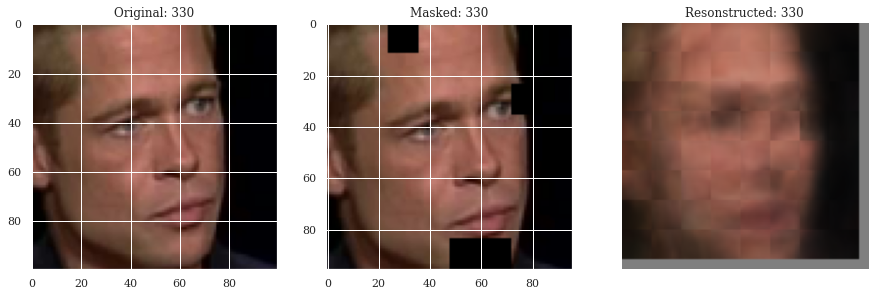

88/88 [==============================] - 9s 101ms/step - loss: 0.0057 - mae: 0.0547 - val_loss: 0.0075 - val_mae: 0.0613
Epoch 332/1000
88/88 [==============================] - 9s 96ms/step - loss: 0.0057 - mae: 0.0544 - val_loss: 0.0075 - val_mae: 0.0610
Epoch 333/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0057 - mae: 0.0544 - val_loss: 0.0075 - val_mae: 0.0607
Epoch 334/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0057 - mae: 0.0546 - val_loss: 0.0076 - val_mae: 0.0618
Epoch 335/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0058 - mae: 0.0551 - val_loss: 0.0078 - val_mae: 0.0623
Epoch 336/1000
88/88 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.0549
Idx chosen: 8


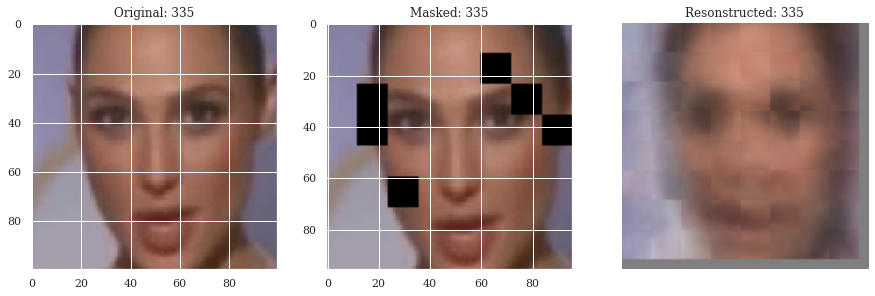

88/88 [==============================] - 9s 100ms/step - loss: 0.0057 - mae: 0.0549 - val_loss: 0.0076 - val_mae: 0.0613
Epoch 337/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0057 - mae: 0.0546 - val_loss: 0.0074 - val_mae: 0.0604
Epoch 338/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0057 - mae: 0.0548 - val_loss: 0.0077 - val_mae: 0.0623
Epoch 339/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0057 - mae: 0.0544 - val_loss: 0.0075 - val_mae: 0.0612
Epoch 340/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0058 - mae: 0.0551 - val_loss: 0.0079 - val_mae: 0.0633
Epoch 341/1000
88/88 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.0548
Idx chosen: 49


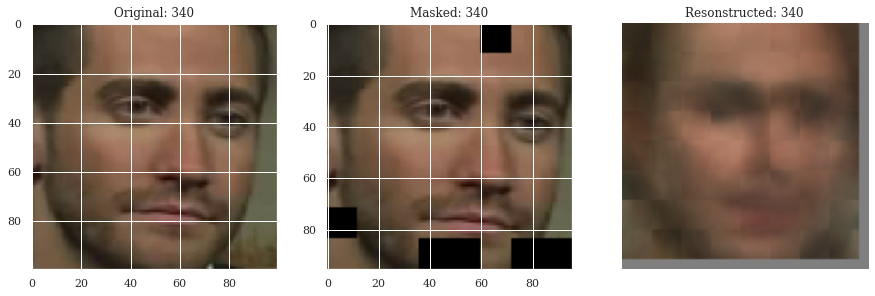

88/88 [==============================] - 9s 100ms/step - loss: 0.0057 - mae: 0.0548 - val_loss: 0.0075 - val_mae: 0.0616
Epoch 342/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0057 - mae: 0.0543 - val_loss: 0.0077 - val_mae: 0.0624
Epoch 343/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0057 - mae: 0.0546 - val_loss: 0.0074 - val_mae: 0.0610
Epoch 344/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0057 - mae: 0.0546 - val_loss: 0.0075 - val_mae: 0.0613
Epoch 345/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0057 - mae: 0.0544 - val_loss: 0.0075 - val_mae: 0.0609
Epoch 346/1000
88/88 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.0546
Idx chosen: 25


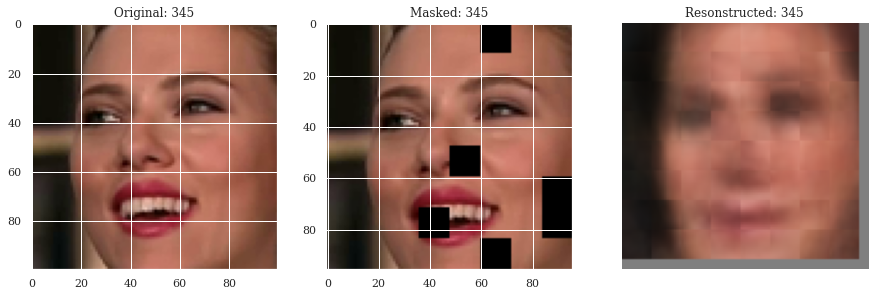

88/88 [==============================] - 9s 100ms/step - loss: 0.0057 - mae: 0.0546 - val_loss: 0.0076 - val_mae: 0.0617
Epoch 347/1000
88/88 [==============================] - 9s 97ms/step - loss: 0.0058 - mae: 0.0551 - val_loss: 0.0082 - val_mae: 0.0645
Epoch 348/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0059 - mae: 0.0557 - val_loss: 0.0076 - val_mae: 0.0615
Epoch 349/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0057 - mae: 0.0547 - val_loss: 0.0076 - val_mae: 0.0618
Epoch 350/1000
88/88 [==============================] - 19s 211ms/step - loss: 0.0057 - mae: 0.0544 - val_loss: 0.0073 - val_mae: 0.0607
Epoch 351/1000
88/88 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.0543
Idx chosen: 54


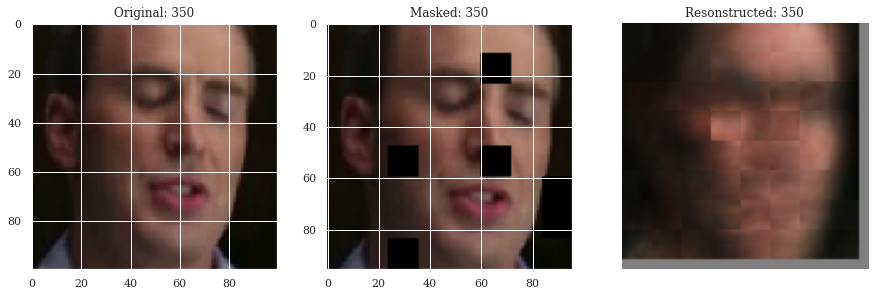

88/88 [==============================] - 9s 104ms/step - loss: 0.0057 - mae: 0.0543 - val_loss: 0.0077 - val_mae: 0.0623
Epoch 352/1000
88/88 [==============================] - 9s 96ms/step - loss: 0.0057 - mae: 0.0545 - val_loss: 0.0075 - val_mae: 0.0617
Epoch 353/1000
88/88 [==============================] - 9s 96ms/step - loss: 0.0056 - mae: 0.0541 - val_loss: 0.0074 - val_mae: 0.0605
Epoch 354/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0057 - mae: 0.0545 - val_loss: 0.0076 - val_mae: 0.0613
Epoch 355/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0056 - mae: 0.0541 - val_loss: 0.0075 - val_mae: 0.0612
Epoch 356/1000
88/88 [==============================] - ETA: 0s - loss: 0.0056 - mae: 0.0541
Idx chosen: 6


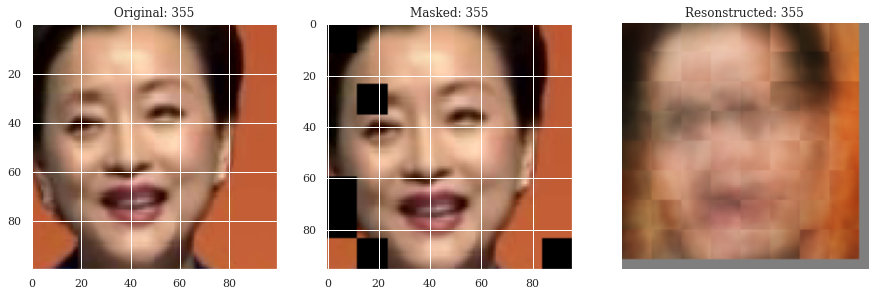

88/88 [==============================] - 9s 100ms/step - loss: 0.0056 - mae: 0.0541 - val_loss: 0.0075 - val_mae: 0.0609
Epoch 357/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0056 - mae: 0.0541 - val_loss: 0.0077 - val_mae: 0.0616
Epoch 358/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0055 - mae: 0.0537 - val_loss: 0.0075 - val_mae: 0.0610
Epoch 359/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0056 - mae: 0.0541 - val_loss: 0.0074 - val_mae: 0.0610
Epoch 360/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0058 - mae: 0.0549 - val_loss: 0.0075 - val_mae: 0.0622
Epoch 361/1000
88/88 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.0546
Idx chosen: 22


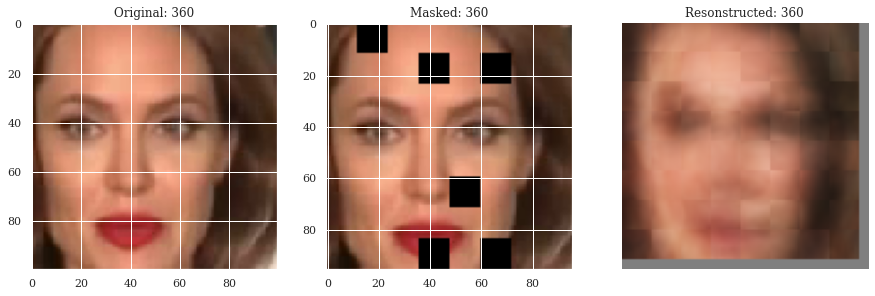

88/88 [==============================] - 19s 216ms/step - loss: 0.0057 - mae: 0.0546 - val_loss: 0.0073 - val_mae: 0.0602
Epoch 362/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0057 - mae: 0.0544 - val_loss: 0.0076 - val_mae: 0.0615
Epoch 363/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0058 - mae: 0.0549 - val_loss: 0.0075 - val_mae: 0.0613
Epoch 364/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0057 - mae: 0.0545 - val_loss: 0.0074 - val_mae: 0.0610
Epoch 365/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0056 - mae: 0.0540 - val_loss: 0.0075 - val_mae: 0.0614
Epoch 366/1000
88/88 [==============================] - ETA: 0s - loss: 0.0056 - mae: 0.0540
Idx chosen: 28


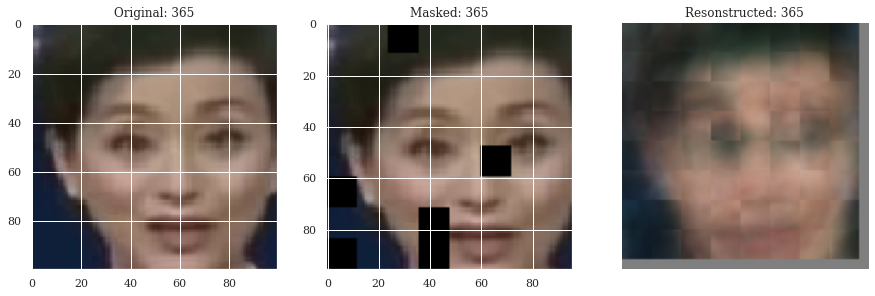

88/88 [==============================] - 9s 100ms/step - loss: 0.0056 - mae: 0.0540 - val_loss: 0.0073 - val_mae: 0.0603
Epoch 367/1000
88/88 [==============================] - 18s 210ms/step - loss: 0.0055 - mae: 0.0534 - val_loss: 0.0073 - val_mae: 0.0597
Epoch 368/1000
88/88 [==============================] - 9s 98ms/step - loss: 0.0055 - mae: 0.0538 - val_loss: 0.0074 - val_mae: 0.0606
Epoch 369/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0057 - mae: 0.0547 - val_loss: 0.0073 - val_mae: 0.0610
Epoch 370/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0056 - mae: 0.0540 - val_loss: 0.0074 - val_mae: 0.0605
Epoch 371/1000
88/88 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.0545
Idx chosen: 56


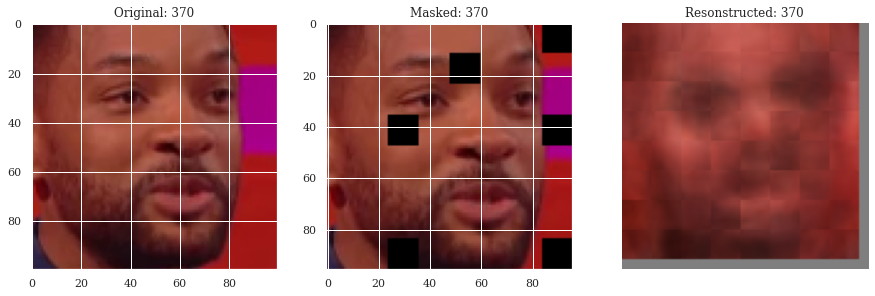

88/88 [==============================] - 9s 101ms/step - loss: 0.0057 - mae: 0.0545 - val_loss: 0.0073 - val_mae: 0.0607
Epoch 372/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0056 - mae: 0.0541 - val_loss: 0.0075 - val_mae: 0.0613
Epoch 373/1000
88/88 [==============================] - 18s 210ms/step - loss: 0.0056 - mae: 0.0540 - val_loss: 0.0072 - val_mae: 0.0603
Epoch 374/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0057 - mae: 0.0544 - val_loss: 0.0075 - val_mae: 0.0607
Epoch 375/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0056 - mae: 0.0537 - val_loss: 0.0073 - val_mae: 0.0602
Epoch 376/1000
88/88 [==============================] - ETA: 0s - loss: 0.0056 - mae: 0.0542
Idx chosen: 58


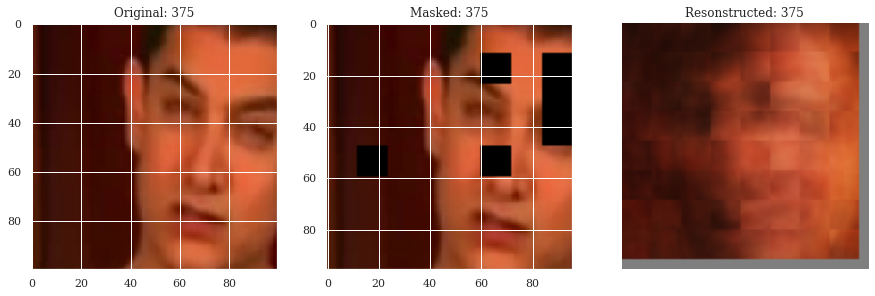

88/88 [==============================] - 9s 101ms/step - loss: 0.0056 - mae: 0.0542 - val_loss: 0.0074 - val_mae: 0.0613
Epoch 377/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0056 - mae: 0.0542 - val_loss: 0.0077 - val_mae: 0.0622
Epoch 378/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0057 - mae: 0.0547 - val_loss: 0.0073 - val_mae: 0.0608
Epoch 379/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0056 - mae: 0.0541 - val_loss: 0.0074 - val_mae: 0.0608
Epoch 380/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0056 - mae: 0.0539 - val_loss: 0.0073 - val_mae: 0.0604
Epoch 381/1000
88/88 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.0537
Idx chosen: 60


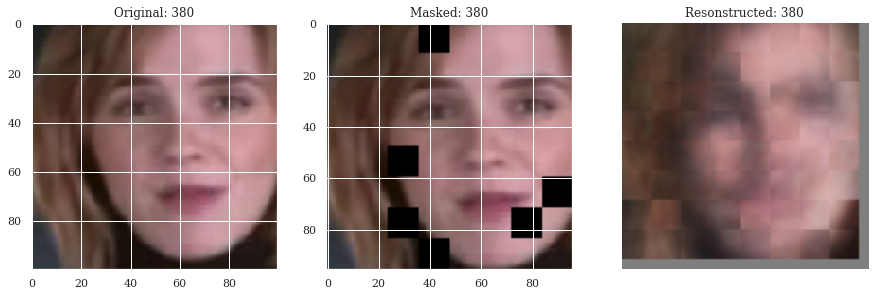

88/88 [==============================] - 9s 101ms/step - loss: 0.0055 - mae: 0.0537 - val_loss: 0.0074 - val_mae: 0.0606
Epoch 382/1000
88/88 [==============================] - 18s 207ms/step - loss: 0.0055 - mae: 0.0537 - val_loss: 0.0071 - val_mae: 0.0594
Epoch 383/1000
88/88 [==============================] - 9s 100ms/step - loss: 0.0055 - mae: 0.0539 - val_loss: 0.0075 - val_mae: 0.0611
Epoch 384/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0056 - mae: 0.0542 - val_loss: 0.0073 - val_mae: 0.0608
Epoch 385/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0055 - mae: 0.0537 - val_loss: 0.0074 - val_mae: 0.0601
Epoch 386/1000
88/88 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.0547
Idx chosen: 15


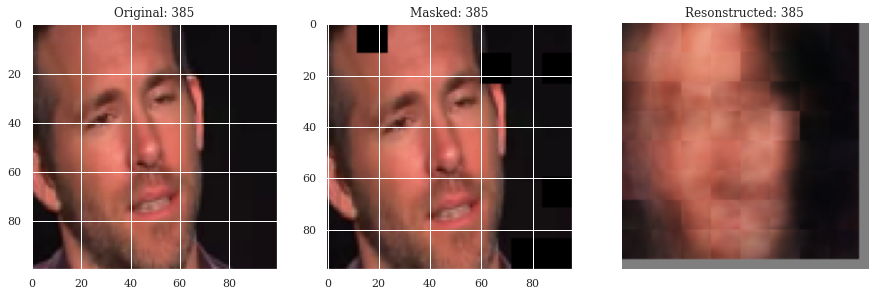

88/88 [==============================] - 9s 99ms/step - loss: 0.0057 - mae: 0.0547 - val_loss: 0.0077 - val_mae: 0.0622
Epoch 387/1000
88/88 [==============================] - 9s 95ms/step - loss: 0.0055 - mae: 0.0537 - val_loss: 0.0074 - val_mae: 0.0610
Epoch 388/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0056 - mae: 0.0537 - val_loss: 0.0074 - val_mae: 0.0608
Epoch 389/1000
88/88 [==============================] - 9s 96ms/step - loss: 0.0056 - mae: 0.0541 - val_loss: 0.0072 - val_mae: 0.0597
Epoch 390/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0057 - mae: 0.0544 - val_loss: 0.0075 - val_mae: 0.0615
Epoch 391/1000
88/88 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.0547
Idx chosen: 47


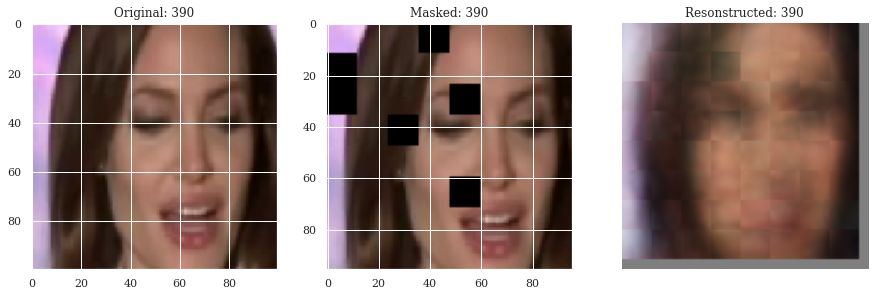

88/88 [==============================] - 9s 101ms/step - loss: 0.0057 - mae: 0.0547 - val_loss: 0.0073 - val_mae: 0.0610
Epoch 392/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0055 - mae: 0.0536 - val_loss: 0.0073 - val_mae: 0.0604
Epoch 393/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0055 - mae: 0.0536 - val_loss: 0.0073 - val_mae: 0.0602
Epoch 394/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0055 - mae: 0.0537 - val_loss: 0.0072 - val_mae: 0.0600
Epoch 395/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0055 - mae: 0.0534 - val_loss: 0.0074 - val_mae: 0.0603
Epoch 396/1000
88/88 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.0535
Idx chosen: 26


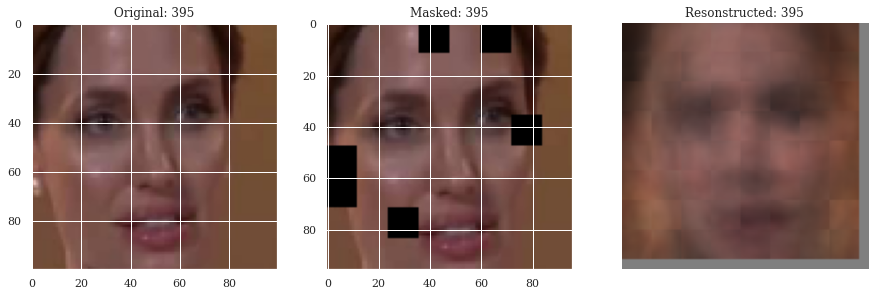

88/88 [==============================] - 9s 100ms/step - loss: 0.0055 - mae: 0.0535 - val_loss: 0.0072 - val_mae: 0.0600
Epoch 397/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0055 - mae: 0.0536 - val_loss: 0.0073 - val_mae: 0.0605
Epoch 398/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0054 - mae: 0.0531 - val_loss: 0.0073 - val_mae: 0.0609
Epoch 399/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0055 - mae: 0.0535 - val_loss: 0.0072 - val_mae: 0.0600
Epoch 400/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0055 - mae: 0.0537 - val_loss: 0.0073 - val_mae: 0.0603
Epoch 401/1000
88/88 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.0536
Idx chosen: 38


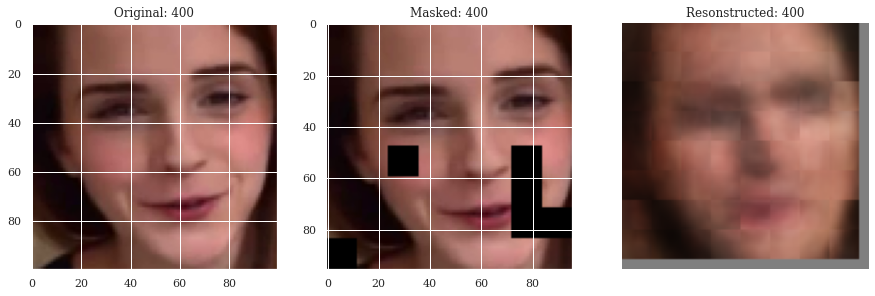

88/88 [==============================] - 9s 100ms/step - loss: 0.0055 - mae: 0.0536 - val_loss: 0.0072 - val_mae: 0.0600
Epoch 402/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0054 - mae: 0.0533 - val_loss: 0.0076 - val_mae: 0.0616
Epoch 403/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0055 - mae: 0.0535 - val_loss: 0.0072 - val_mae: 0.0601
Epoch 404/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0054 - mae: 0.0532 - val_loss: 0.0072 - val_mae: 0.0598
Epoch 405/1000
88/88 [==============================] - 9s 96ms/step - loss: 0.0054 - mae: 0.0530 - val_loss: 0.0075 - val_mae: 0.0611
Epoch 406/1000
88/88 [==============================] - ETA: 0s - loss: 0.0056 - mae: 0.0538
Idx chosen: 26


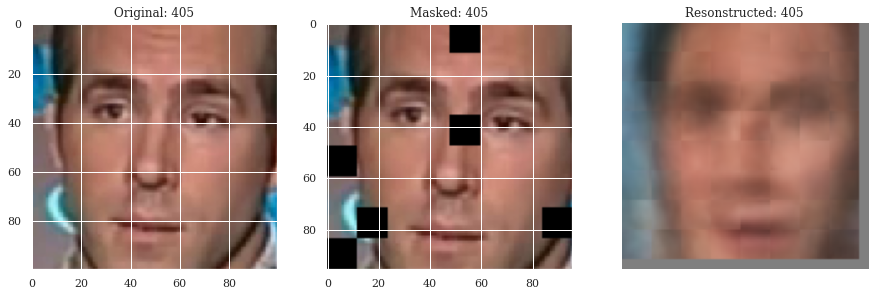

88/88 [==============================] - 9s 100ms/step - loss: 0.0056 - mae: 0.0538 - val_loss: 0.0073 - val_mae: 0.0605
Epoch 407/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0055 - mae: 0.0538 - val_loss: 0.0073 - val_mae: 0.0603
Epoch 408/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0055 - mae: 0.0533 - val_loss: 0.0072 - val_mae: 0.0597
Epoch 409/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0056 - mae: 0.0539 - val_loss: 0.0072 - val_mae: 0.0603
Epoch 410/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0056 - mae: 0.0541 - val_loss: 0.0073 - val_mae: 0.0601
Epoch 411/1000
88/88 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.0535
Idx chosen: 35


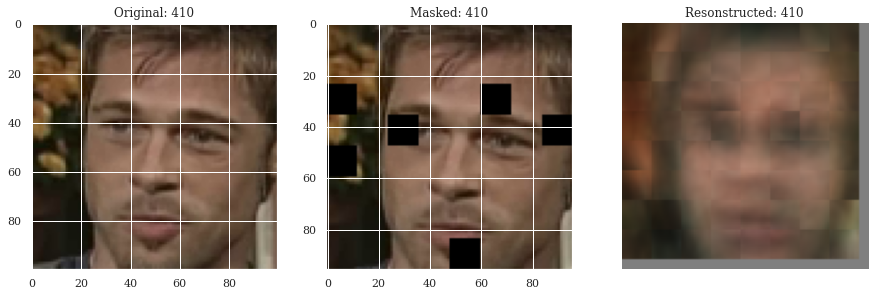

88/88 [==============================] - 9s 100ms/step - loss: 0.0055 - mae: 0.0535 - val_loss: 0.0073 - val_mae: 0.0605
Epoch 412/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0054 - mae: 0.0532 - val_loss: 0.0072 - val_mae: 0.0602
Epoch 413/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0054 - mae: 0.0532 - val_loss: 0.0073 - val_mae: 0.0612
Epoch 414/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0055 - mae: 0.0536 - val_loss: 0.0074 - val_mae: 0.0609
Epoch 415/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0054 - mae: 0.0532 - val_loss: 0.0073 - val_mae: 0.0600
Epoch 416/1000
88/88 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.0534
Idx chosen: 30


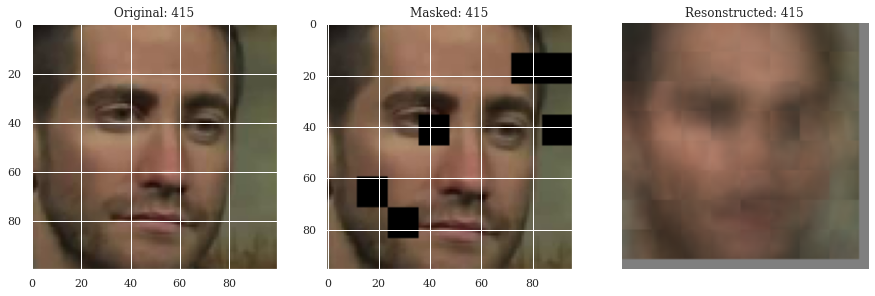

88/88 [==============================] - 9s 100ms/step - loss: 0.0055 - mae: 0.0534 - val_loss: 0.0072 - val_mae: 0.0604
Epoch 417/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0055 - mae: 0.0534 - val_loss: 0.0074 - val_mae: 0.0602
Epoch 418/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0055 - mae: 0.0533 - val_loss: 0.0073 - val_mae: 0.0603
Epoch 419/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0054 - mae: 0.0533 - val_loss: 0.0075 - val_mae: 0.0606
Epoch 420/1000
88/88 [==============================] - 8s 94ms/step - loss: 0.0054 - mae: 0.0532 - val_loss: 0.0072 - val_mae: 0.0600
Epoch 421/1000
88/88 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.0534
Idx chosen: 53


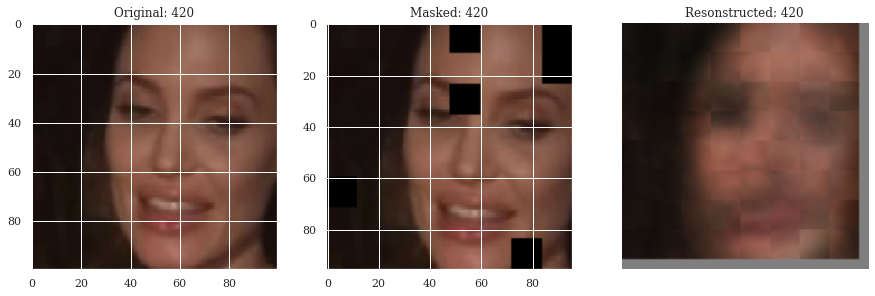

88/88 [==============================] - 9s 100ms/step - loss: 0.0055 - mae: 0.0534 - val_loss: 0.0072 - val_mae: 0.0600
Epoch 422/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0055 - mae: 0.0534 - val_loss: 0.0072 - val_mae: 0.0595
Epoch 423/1000
88/88 [==============================] - 8s 95ms/step - loss: 0.0055 - mae: 0.0535 - val_loss: 0.0072 - val_mae: 0.0606
Epoch 424/1000
88/88 [==============================] - 8s 96ms/step - loss: 0.0053 - mae: 0.0527 - val_loss: 0.0072 - val_mae: 0.0601
Epoch 425/1000
88/88 [==============================] - 9s 97ms/step - loss: 0.0054 - mae: 0.0530 - val_loss: 0.0071 - val_mae: 0.0594
Epoch 426/1000
88/88 [==============================] - ETA: 0s - loss: 0.0054 - mae: 0.0532
Idx chosen: 18


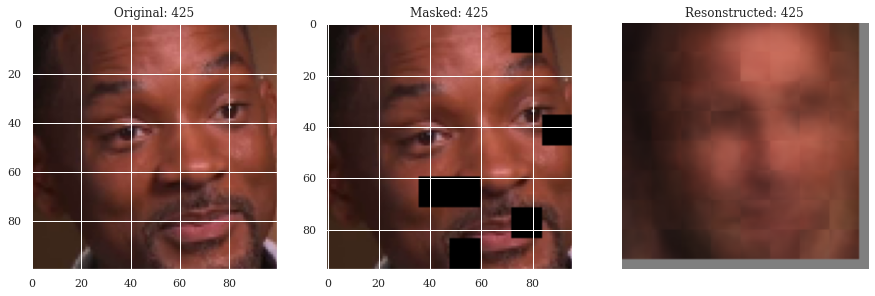

88/88 [==============================] - 9s 103ms/step - loss: 0.0054 - mae: 0.0532 - val_loss: 0.0072 - val_mae: 0.0598
Epoch 427/1000
88/88 [==============================] - 9s 99ms/step - loss: 0.0054 - mae: 0.0533 - val_loss: 0.0072 - val_mae: 0.0602
Epoch 428/1000
88/88 [==============================] - 9s 104ms/step - loss: 0.0054 - mae: 0.0532 - val_loss: 0.0071 - val_mae: 0.0597
Epoch 429/1000
88/88 [==============================] - 9s 102ms/step - loss: 0.0054 - mae: 0.0532 - val_loss: 0.0073 - val_mae: 0.0601
Epoch 430/1000
88/88 [==============================] - 9s 100ms/step - loss: 0.0054 - mae: 0.0533 - val_loss: 0.0072 - val_mae: 0.0595
Epoch 431/1000
88/88 [==============================] - ETA: 0s - loss: 0.0056 - mae: 0.0537
Idx chosen: 25


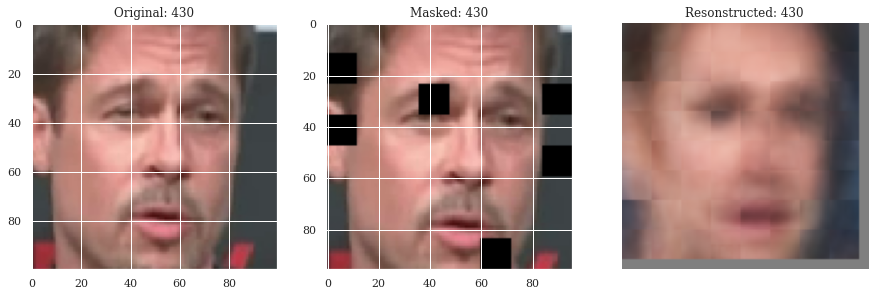

88/88 [==============================] - 9s 105ms/step - loss: 0.0056 - mae: 0.0537 - val_loss: 0.0074 - val_mae: 0.0605
Epoch 432/1000
88/88 [==============================] - 9s 101ms/step - loss: 0.0055 - mae: 0.0534 - val_loss: 0.0072 - val_mae: 0.0597
Epoch 432: early stopping


In [20]:
patch_encoder.downstream = False
history = mae_model.fit(GEN,
                        validation_data=VAL_GEN, 
                        callbacks=\
                            train_callbacks+\
                            [ModelCheckpoint(f"../../_WEIGHTS/mae/weights", save_best_only=True, monitor='val_loss', mode='min', save_weights_only=True)]+\
                            [EarlyStopping(patience=50, monitor='val_loss', mode='min', restore_best_weights=True, verbose=1)],
                        epochs=EPOCHS,
                        verbose=1)

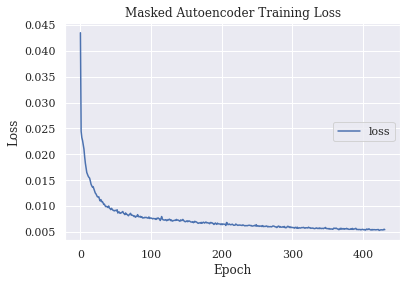

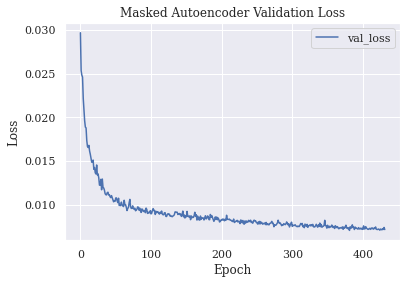

In [21]:
# Test the model after training
# test_results = model.evaluate(t_X_test, t_y_test, steps=1, verbose=False)
# print(f'Test results - Loss: {test_results[0]:3f} - mse: {100*test_results[1]:.3f}')

plt.plot(history.history['loss'])
# plt.plot(history.history['mae'])
    # plt.plot(history.history['val_loss'])
# plt.plot(history.history['val_mae'])
plt.title('Masked Autoencoder Training Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss', 'mae'], loc='center right')
plt.show()

# plt.plot(history.history['loss'])
# plt.plot(history.history['mae'])
plt.plot(history.history['val_loss'])
# plt.plot(history.history['val_mae'])
plt.title('Masked Autoencoder Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['val_loss', 'val_mae'], loc='upper right')
plt.show()

In [22]:
# load_best_model(mae_model)

In [23]:
# Extract the augmentation layers.
train_augmentation_model = mae_model.train_augmentation_model
test_augmentation_model = mae_model.test_augmentation_model

# Extract the patchers.
patch_layer = mae_model.patch_layer
patch_encoder = mae_model.patch_encoder
patch_encoder.downstream = True  # Swtich the downstream flag to True.

# Extract the encoder.
encoder = mae_model.encoder


# Pack as a model.
downstream_model = keras.Sequential(
    [
        layers.Input((IMAGE_SIZE, IMAGE_SIZE, 3)),
        patch_layer,
        patch_encoder,
        encoder,
        # layers.BatchNormalization(),  # Refer to A.1 (Linear probing).
        # layers.GlobalAveragePooling1D(),
        # layers.Dense(NUM_CLASSES, activation="softmax"),
    ],
    name="linear_probe_model",
)
# # Pack as a model.
# downstream_model = keras.Sequential(
#     [
#         layers.Input((IMAGE_SIZE, IMAGE_SIZE, 3)),
#         patch_layer,
#         patch_encoder,
#         encoder,
#         layers.BatchNormalization(),  # Refer to A.1 (Linear probing).
#         layers.GlobalAveragePooling1D(),
#         layers.Dense(NUM_CLASSES, activation="softmax"),
#     ],
#     name="linear_probe_model",
# )

# Only the final classification layer of the `downstream_model` should be trainable.
# for layer in downstream_model.layers[:-1]:
#     layer.trainable = False

downstream_model.compile()
# downstream_model.summary()

  0%|          | 0/306 [00:00<?, ?it/s]

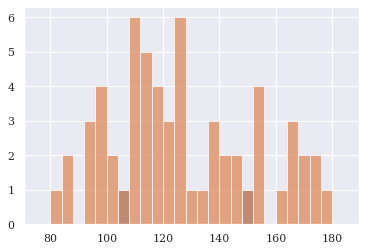

 21%|██        | 64/306 [00:11<00:49,  4.92it/s]

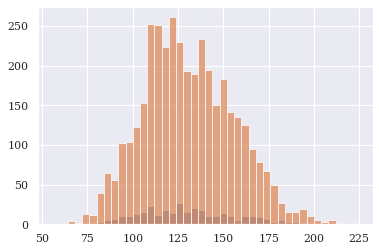

 42%|████▏     | 128/306 [00:21<00:28,  6.24it/s]

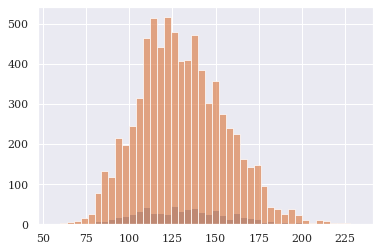

 63%|██████▎   | 192/306 [00:32<00:18,  6.19it/s]

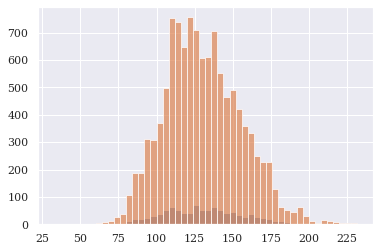

 84%|████████▎ | 256/306 [00:43<00:07,  6.32it/s]

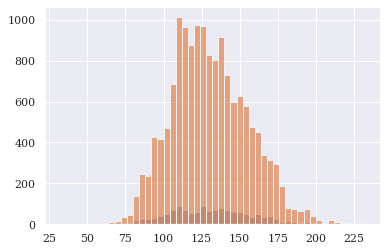

100%|██████████| 306/306 [00:52<00:00,  5.83it/s]


In [24]:
score = {0:[],1:[]}
for b, (X, y) in tqdm(enumerate(TEST_GEN), total=len(TEST_GEN)-1):
    Z = downstream_model.predict(X)
    X_prime = decoder.predict(Z)
    for i in range(y.shape[0]):
        label = int(y[i])
        xi = X[i,:].flatten()
        xo = X_prime[i,:].flatten()
        recon_loss = (((xi - xo)**2).sum()/TEST_GEN.n)**0.5
        score[label].append(recon_loss)

    if b >= (TEST_GEN.samples / TEST_GEN.batch_size) - 1:
        break

    if not b % 64:
        min_r, max_r = int(min(min(score[0]), min(score[1]))), int(max(max(score[0]), max(score[1])))
        k = 4
        bins = [x*k for x in range(min_r//k -k//4, max_r//k +k//4)]
        plt.hist(score[0], bins, alpha=0.7)[2]
        plt.hist(score[1], bins, alpha=0.7)[2]
        plt.show()

In [25]:
# def solve(m1,m2,std1,std2):
#   a = 1/(2*std1**2) - 1/(2*std2**2)
#   b = m2/(std2**2) - m1/(std1**2)
#   c = m1**2 /(2*std1**2) - m2**2 / (2*std2**2) - np.log(std2/std1)
#   return np.roots([a,b,c])

# intersec = solve(np.mean(score[1]), np.mean(score[0]), np.var(score[1]), np.mean(score[0]))

<BarContainer object of 51 artists>

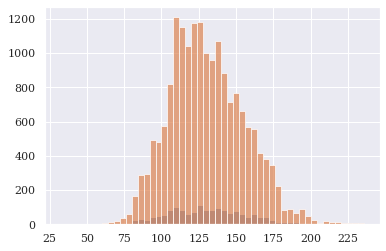

In [26]:
min_r, max_r = int(min(min(score[0]), min(score[1]))), int(max(max(score[0]), max(score[1])))
k = 4
bins = [x*k for x in range(min_r//k -k//4, max_r//k +k//4)]
plt.hist(score[0], bins, alpha=0.7)[2]
plt.hist(score[1], bins, alpha=0.7)[2]